In [1]:
from utils_review import *

## Zeeman's Primary and Secondary Waves 

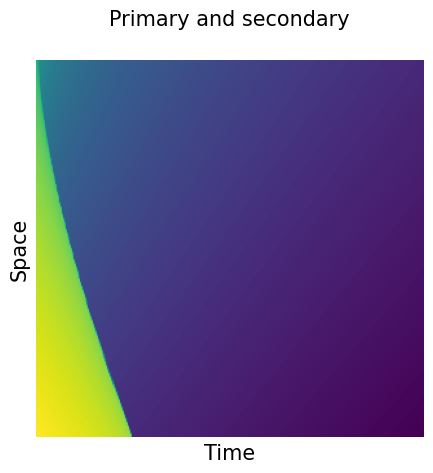

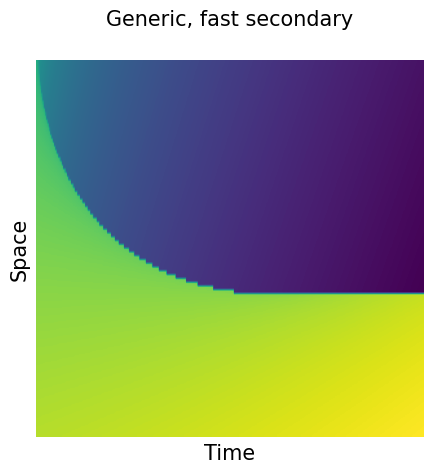

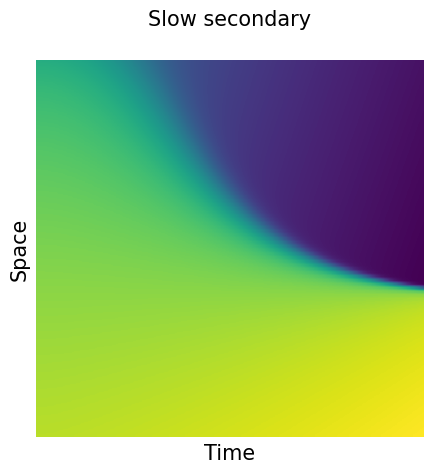

In [2]:
def dx_cusp(t, conc, ap_positions, param):
    u = conc[:]
    epsilon=param["epsilon"]
    mix=param["mix"]
    du=epsilon*(-0.05*t + 10*(ap_positions+mix*t)*u-u*u*u)
    return np.array([du])


ode_param = {
    "epsilon" : 1,
    "mix" : 0.0
}
    

times = np.linspace(-100, 0, 300)
n_cells = 100
ap_positions = np.linspace(1.0, 0.0, n_cells)
init_conc = 1.5*np.ones((1, n_cells))

results = integrate(dx_cusp, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions,ode_param, )).y

init_conc=np.array([results[:,-1]])

times = np.linspace(0, 1000, 300)
n_cells = 100
ap_positions = np.linspace(1.0, 0.0, n_cells)

results = integrate(dx_cusp, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions,ode_param, )).y

plot_kymo(results, 'Primary and secondary')

ode_param["mix"]=0.002
results = integrate(dx_cusp, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions,ode_param, )).y

plot_kymo(results,  'Generic, fast secondary')

#ode_param["mix"]=0.0
ode_param["epsilon"]=0.001
results = integrate(dx_cusp, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions,ode_param, )).y


plot_kymo(results, 'Slow secondary')






## Original Clock and Wavefront

Simulating the Cusp catastrophe coupled to a clock

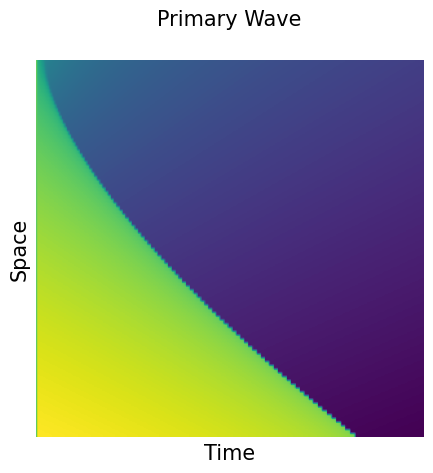

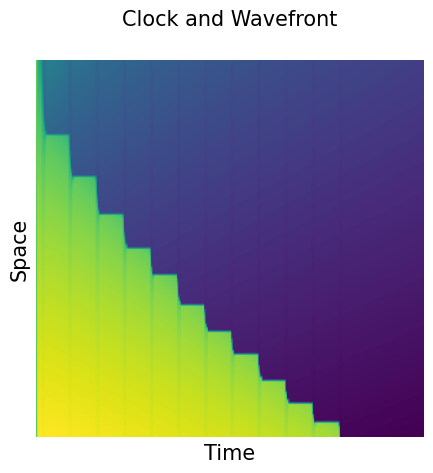

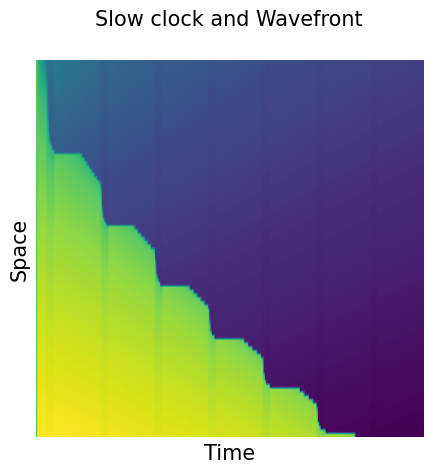

In [3]:
def dx_CW(t, conc, ap_positions,param):
    u = conc[:]
    du=(-0.05*t + 10*(ap_positions+0*0.02*t)*u-u*u*u)
    omega=param["omega_clock"]
    flag=param["flag"]
    if (np.sin(omega*t)>0.9) and (flag==1):
        du=du-1 #a very simple periodic kick
    return np.array([du])



ode_param = {
    "flag" : 0,
    "omega_clock" : 0.3
}


times = np.linspace(0, 300, 300)
n_cells = 100
ap_positions = np.linspace(1.0, 0.0, n_cells)
init_conc = 1.5*np.ones((1, n_cells))

results = integrate(dx_CW, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions,ode_param, )).y

plot_kymo(results, 'Primary Wave')

ode_param["flag"]=1
results = integrate(dx_CW, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions,ode_param, )).y

plot_kymo(results, 'Clock and Wavefront')

ode_param["omega_clock"]=0.15


results = integrate(dx_CW, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions,ode_param, )).y

plot_kymo(results, 'Slow clock and Wavefront')

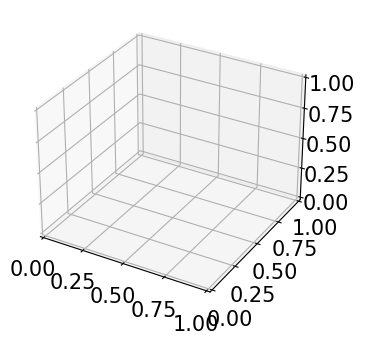

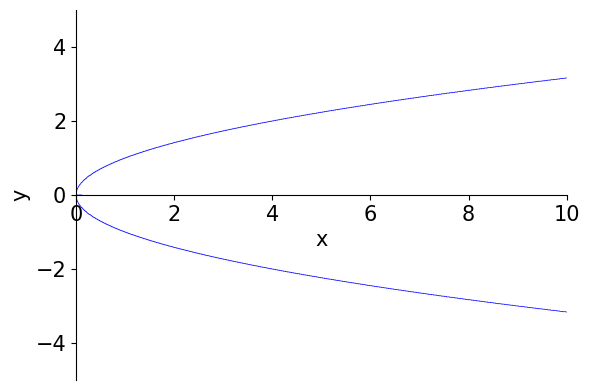

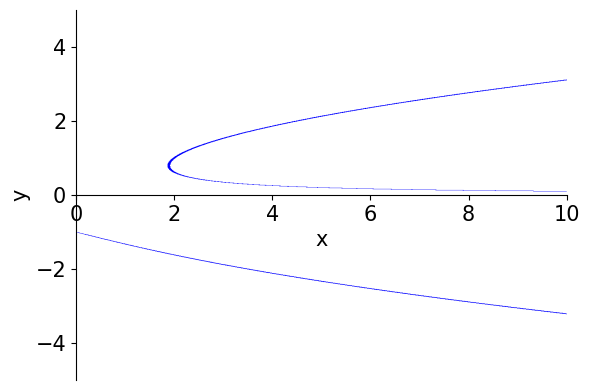

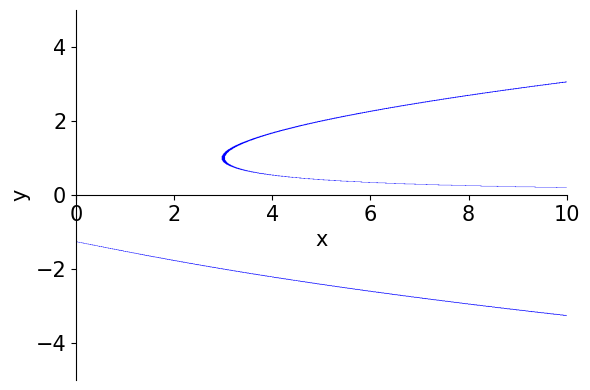

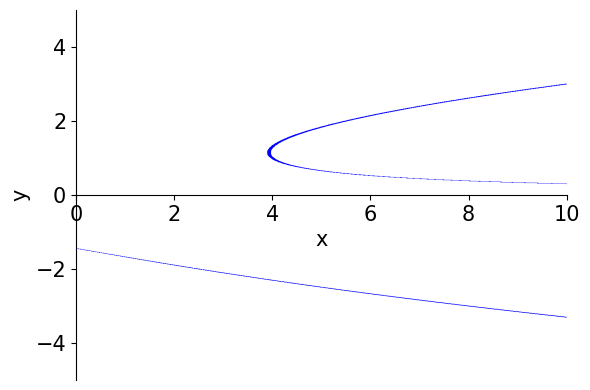

...

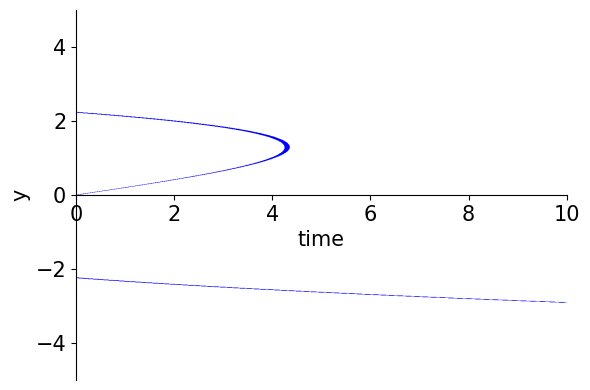

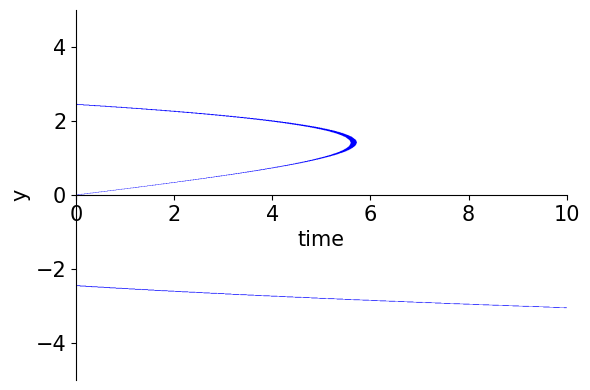

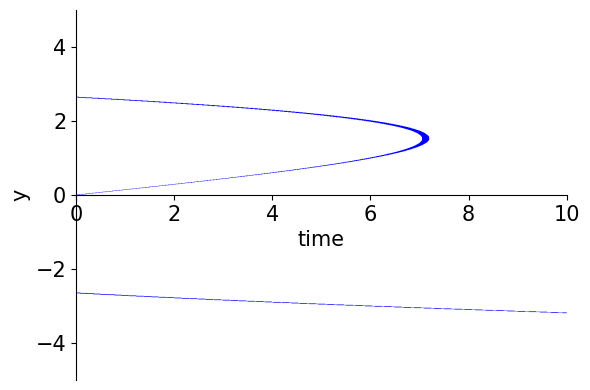

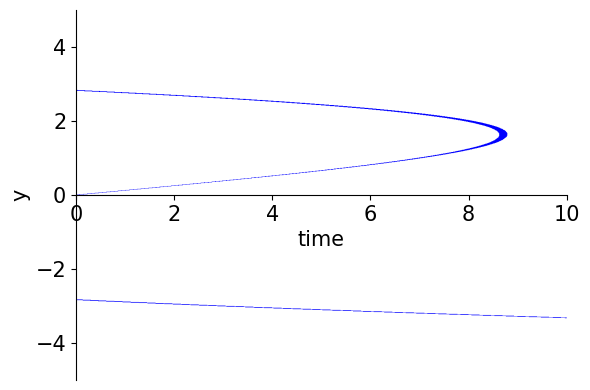

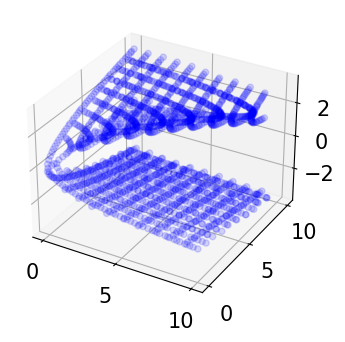

In [5]:
#Complicated Implicit scripts to plot Fig 4D.... fell free to skip


from sympy import *
from sympy.plotting import plot_implicit
from matplotlib import cm



def implicit_plot(u):
    x,y=symbols('x y')
    p1=plot_implicit(Eq(-u+x*y-y**3,0),(x,0,10))
    return p1
    

def decimate_data(X_s,Y_s,Z_s, param):
    X_p=np.array([])
    Y_p=np.array([])
    Z_p=np.array([])
    for i in range(X_s.shape[0]):
        if (i % param ==0):
            X_p=np.concatenate((X_p,[X_s[i]]))
            Y_p=np.concatenate((Y_p,[Y_s[i]]))
            Z_p=np.concatenate((Z_p,[Z_s[i]]))
    return X_p,Y_p,Z_p

def return_data_fold(time):
    pli=implicit_plot(time)
    series = pli[0]
    data, action = series.get_points()
    data = np.array([(x_int.mid, y_int.mid) for x_int, y_int in data])
    data_sorted = data[data[:, 1].argsort()]
    # data[0,:] corresponds to values of x, in our case PI, data [1,:] corresponds to solution of the fold
    return data_sorted

    
def plot_fold(range_time):
    fig = plt.figure()
    ax = plt.axes(projection ='3d')
    X_s=np.array([])
    Y_s=np.array([])
    Z_s=np.array([])
    for j in range(range_time):
        time=j
        data=return_data_fold(time)
        time_vector=j*np.ones(data.shape[0])
        X_s=np.concatenate((X_s,time_vector))
        Y_s=np.concatenate((Y_s,data[:,0]))
        Z_s=np.concatenate((Z_s,data[:,1]))
    ax.scatter(X_s, Y_s, Z_s, cmap=cm.jet, linewidth=0)
    return X_s,Y_s,Z_s


def slice_data(X_s,Y_s,Z_s):
    X_p=np.array([])
    Y_p=np.array([])
    Z_p=np.array([])
    X_n=np.array([])
    Y_n=np.array([])
    Z_n=np.array([])
    print(X_s.shape[0])
    for i in range(X_s.shape[0]):
        if (Z_s[i]>0.01):
            X_p=np.concatenate((X_p,[X_s[i]]))
            Y_p=np.concatenate((Y_p,[Y_s[i]]))
            Z_p=np.concatenate((Z_p,[Z_s[i]]))
        if (Z_s[i]<0.01):
            X_n=np.concatenate((X_n,[X_s[i]]))
            Y_n=np.concatenate((Y_n,[Y_s[i]]))
            Z_n=np.concatenate((Z_n,[Z_s[i]]))
    return X_p,Y_p,Z_p,X_n,Y_n,Z_n


def implicit_plot_2(u):
    time,y=symbols('time y')
    p1=plot_implicit(Eq(-time+u*y-y**3,0),(time,0,10))
    return p1



def return_data_fold_2(space):
    pli=implicit_plot_2(space)
    series = pli[0]
    data, action = series.get_points()
    data = np.array([(x_int.mid, y_int.mid) for x_int, y_int in data])
    data_sorted = data[data[:, 1].argsort()]
    # data[0,:] corresponds to values of x, in our case PI, data [1,:] corresponds to solution of the fold
    return data_sorted


def plot_fold_2(range_space):
    fig = plt.figure()
    ax = plt.axes(projection ='3d')
    X_s=np.array([])
    Y_s=np.array([])
    Z_s=np.array([])
    for j in range(range_space):
        space=(j-1)
        data=return_data_fold_2(space)
        space_vector=j*np.ones(data.shape[0])
        X_s=np.concatenate((X_s,space_vector))
        Y_s=np.concatenate((Y_s,data[:,0]))
        Z_s=np.concatenate((Z_s,data[:,1]))
    X_p,Y_p,Z_p=decimate_data(X_s,Y_s,Z_s,30)

    ax.scatter(Y_p, X_p, Z_p, cmap=cm.jet, linewidth=0)
    return X_p,Y_p,Z_p




            
X_s,Y_s,Z_s=plot_fold(10)



X_s2,Y_s2,Z_s2=plot_fold_2(10)
X_p,Y_p,Z_p=decimate_data(X_s,Y_s,Z_s, 50)


#X_p,Y_p,Z_p,X_n,Y_n,Z_n=slice_data(X_s,Y_s,Z_s)
fig = plt.figure()
ax = plt.axes(projection ='3d')
ax.scatter(X_p,Y_p,Z_p,color='b', alpha=0.15)
ax.scatter(Y_s2,X_s2,Z_s2,color='b', alpha=0.15)


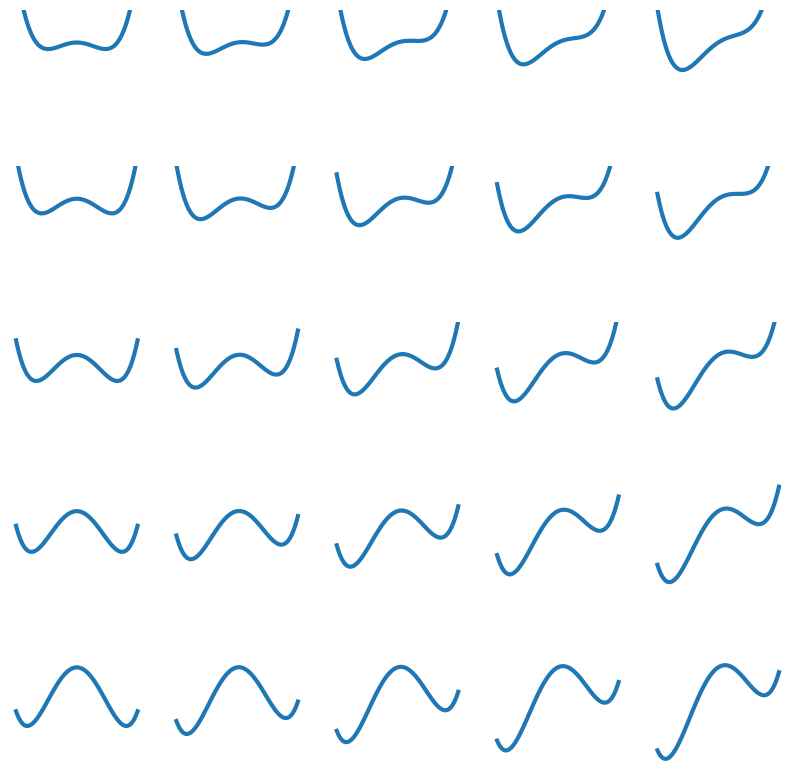

In [4]:
#Let us now plot potentials

def potential_cusp(x,p_i,t):
    return (-0.05*t*x + 5*(p_i)*x*x-x*x*x*x/4)




range_x=np.linspace(-3,3,100)

fig, ax = plt.subplots(5, 5, figsize = (10,10))
t=[0,10,20,30,40]
p=[0.2,0.3,0.4,0.5,0.6]
#Anterior Cell 1
for i in range(5):
    for j in range(5):
        ax[j,i].plot(range_x,-potential_cusp(range_x,p[j],t[i]))
        ax[j,i].set_ylim([-15,5])
        ax[j,i].axis('off')

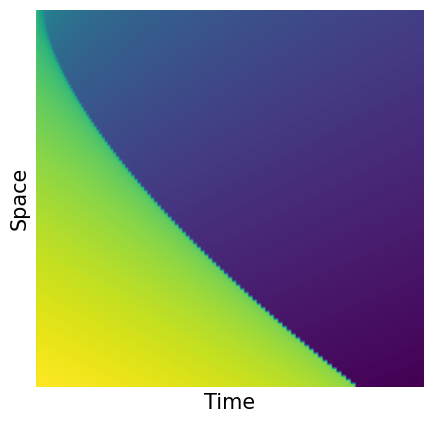

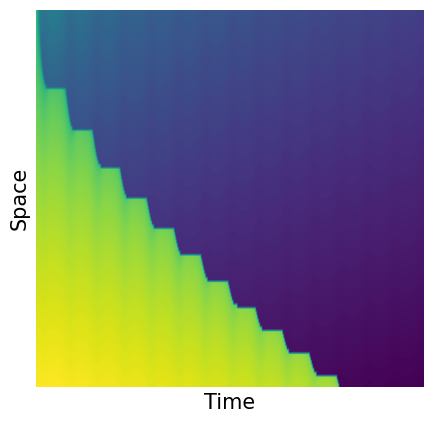

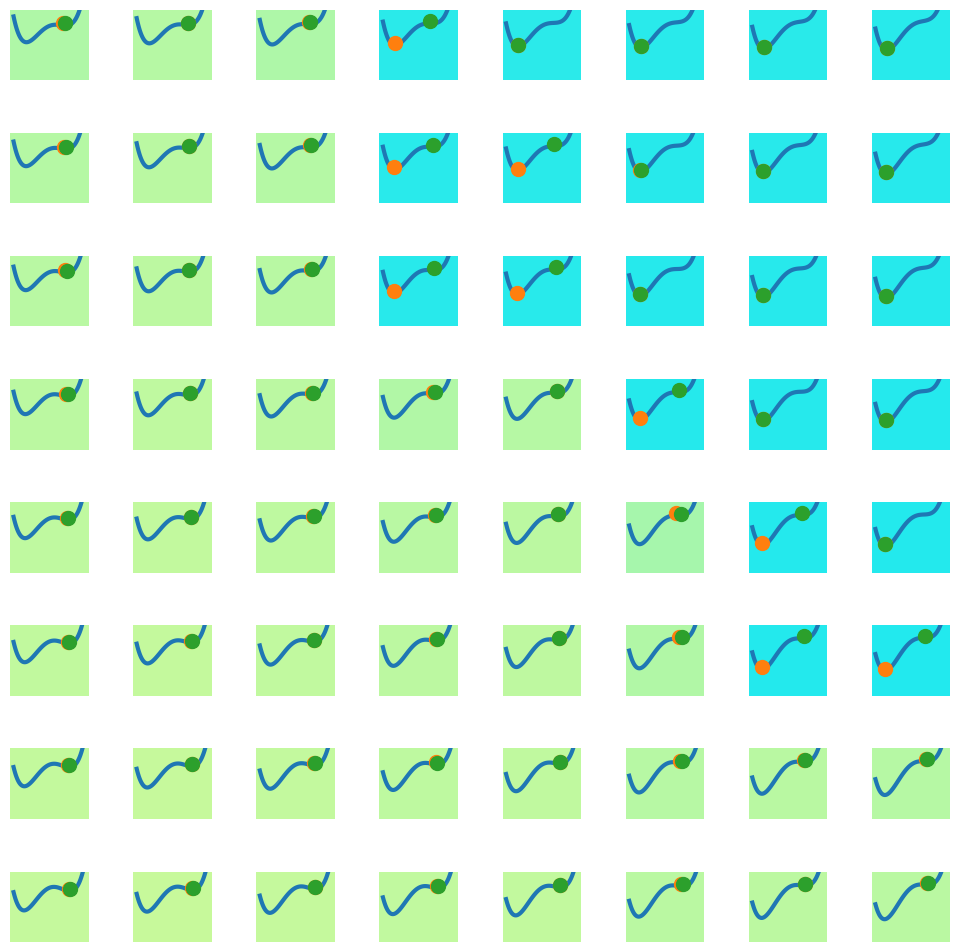

In [5]:
ode_param["omega_clock"]=0.3

def dx_cusp(conc,p_i,t):
    x = conc
    #t is time, p_i is positional information. Notice that t and p_i correspond to the two independent bifurcation parameter
    dx = (-0.05*np.max(t,0) + 10*(p_i)*x-x*x*x)
    return np.array(dx)


def potential_cusp(x,p_i,t):
    return 0.1*(-0.05*np.max(t,0)*x + 5*(p_i)*x*x-0.25*x*x*x*x)



def integrate_CW_modulate(init_conc, ap_positions, time_param, ode_param, flag):

    init_t = time_param["init_t"]
    total_t = time_param["total_t"]
    dt = time_param["dt"]
    omega=ode_param["omega_clock"]
    times = np.arange(init_t, init_t+total_t, dt)
   
    counter = 0
    n_skr = time_param["n_skr"]  # number of Steps modulo which you want to Keep the Results
    

    conc = init_conc[:,0]
    results = []
    times_plot = []
    delay=0
    for t in times[1:]:
    
        dx = dx_cusp(conc,ap_positions,t)
        conc = conc +dx*dt
        #if (np.sin(omega*t)>0.9) and (flag==1) and (t>delay):
        if (flag==1):
            conc=conc-0.0025*(1+np.sin(omega*t))*(1+np.sin(omega*t)) #kick
        counter += 1
        if (counter %n_skr == 0) and (t>delay):
            results.append(conc)
            times_plot.append(t-delay)
        

    results = np.array(results).transpose()
    times_plot = np.array(times_plot)
    return results, times_plot

def plot_landscape(t_i,results_m):
    fig, ax = plt.subplots(10, 1, figsize = (5,30))
    p=1-np.linspace(0.2,0.5,10)
    for j in range(10):
        ap=1-p[j]
        position_l=int(p[j]*n_cells)
        time_l=int(t_i*(time_param["dt"]*time_param["n_skr"]))
        z=results_m[position_l,int(t_i)]
        ax[j].plot(range_x,-potential_cusp(range_x,ap,time_l))
        ax[j].set_ylim([-2,1])
        ax[j].plot(z,0.2-potential_cusp(z,ap,time_l),'o',markersize=10)
        ax[j].axis('off')
        
        
time_param = {
    "init_t" : 0.,
    "total_t" : 300.,
    "dt" : 0.01,
    "n_skr" : 10  # number of Steps modulo which you want to Keep the Results
}

        
        
n_cells = 100
ap_positions = np.linspace(1.0, 0.0, n_cells)


#genes_names = ['A', 'B', 'C']
#genes_colors = ['tab:red', 'tab:blue', 'tab:green']


init_conc_m = 1.5*np.ones((1,n_cells))



results_m_nc,time_m = integrate_CW_modulate(init_conc_m, ap_positions, time_param, ode_param,0)

plot_kymo(results_m_nc)
results_m,time_m = integrate_CW_modulate(init_conc_m, ap_positions, time_param, ode_param,1)

plot_kymo(results_m)



l_max=8
t_max=8
def plot_landscape_bead(results_m,results_m_nc):
    range_x=np.linspace(-4,4,100)
    fig, ax = plt.subplots(l_max, t_max, figsize = (10,10))
    fig.tight_layout()
    p_f=np.linspace(0.48,0.32,l_max)
    for i in range(t_max):
        t_i=680+80*i
        time_l=int(t_i*(time_param["dt"]*time_param["n_skr"]))
        for j in range(l_max):
                    ap=1-p_f[j]
                    position_l=int(p_f[j]*n_cells)
                    ax[j,i].plot(range_x,-potential_cusp(range_x,ap,time_l))
                    z_cw=results_m[position_l,int(t_i)]
                    ax[j,i].plot(z_cw,0.2-potential_cusp(z_cw,ap,time_l),'o',markersize=10)
                    z=results_m_nc[position_l,int(t_i)]
                    ax[j,i].plot(z,0.2-potential_cusp(z,ap,time_l),'.',markersize=20)
                    ax[j,i].set_ylim([-5,1.5])
                    weight=1-(z_cw+4)/8
                    ax[j,i].set_facecolor((1-weight,1-0.1*weight,0.5+0.5*weight))
                    ax[j,i].get_xaxis().set_ticks([])
                    ax[j,i].get_yaxis().set_ticks([])
                    ax[j,i].spines['top'].set_visible(False)
                    ax[j,i].spines['right'].set_visible(False)
                    ax[j,i].spines['bottom'].set_visible(False)
                    ax[j,i].spines['left'].set_visible(False)


plot_landscape_bead(results_m,results_m_nc)

 

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


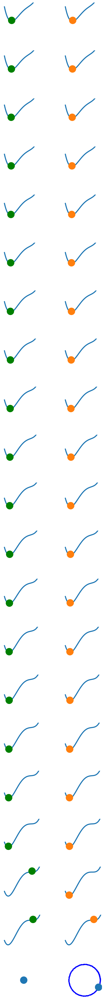

In [9]:
#Functions to make movies. WARNING : I USE  GLOBAL VARIABLES HERE TO SHARE FIGURES, ETC...

l_max=20
fig, ax = plt.subplots(l_max+1, 2, figsize = (5,40))
fig.tight_layout()

def make_frame(t):
    range_x=np.linspace(-4,4,100)
    p_f=1-np.linspace(0.3,0.8,l_max)
    t_i=4*60*t
    ax[l_max,0].clear()
    ax[l_max,1].clear()
    ax[l_max,0].plot(0,0,'o',markersize=20)
    ax[l_max,0].axis('off')
    for i in range(100):
        ax[l_max,1].plot(3*np.cos(0.07*i),3*np.sin(0.07*i),'.',color='b')
    time_l=int(t_i*(time_param["dt"]*time_param["n_skr"]))
    omega=ode_param["omega_clock"]
    for j in range(l_max):
        ax[j,0].clear()
        ax[j,1].clear()
        ap=1-p_f[j]
        position_l=int(p_f[j]*n_cells)
        ax[j,1].plot(range_x,-potential_cusp(range_x,ap,time_l))
        ax[j,0].plot(range_x,-potential_cusp(range_x,ap,time_l))
        z=results_m[position_l,int(t_i)]
       
        ax[j,1].set_ylim([-5,1.5])
        ax[j,1].plot(z,0.2-potential_cusp(z,ap,time_l),'o',markersize=20)
        ax[j,1].axis('off')
        z=results_m_nc[position_l,int(t_i)]
        ax[j,0].set_ylim([-5,1.5])
        ax[j,0].plot(z,0.2-potential_cusp(z,ap,time_l),'o',markersize=20, color = 'g')
        ax[j,0].axis('off')
    ax[l_max,1].plot(3*np.cos(omega*time_l),3*np.sin(omega*time_l),'o',markersize=20)
    ax[l_max,1].set_aspect('equal', adjustable='box')
    ax[l_max,1].axis('off')
    return mplfig_to_npimage(fig)

def make_frame_2(t):
    range_x=np.linspace(-4,4,100)
    p_f=1-np.linspace(0.3,0.8,l_max)
    t_i=4*60*t
    ax[l_max].clear()
    for i in range(100):
        ax[l_max].plot(3*np.cos(0.07*i),3*np.sin(0.07*i),'.',color='b')
    time_l=int(t_i*(time_param["dt"]*time_param["n_skr"]))
    omega=ode_param["omega_clock"]
    for j in range(l_max):
        #ax[0,j].clear()
        ax[j].clear()
        ap=1-p_f[j]
        position_l=int(p_f[j]*n_cells)
        ax[j].plot(range_x,-potential_cusp(range_x,ap,time_l))
        #ax[0,j].plot(range_x,-potential_cusp(range_x,ap,time_l))
        z=results_m[position_l,int(t_i)]
       
        ax[j].set_ylim([-5,1.5])
        ax[j].plot(z,0.2-potential_cusp(z,ap,time_l),'o',markersize=20)
        ax[j].axis('off')
        z=results_m_nc[position_l,int(t_i)]
        #ax[0,j].set_ylim([-5,1.5])
        #ax[0,j].plot(z,0.2-potential_cusp(z,ap,time_l),'o',markersize=20, color = 'g')
        #ax[0,j].axis('off')
    ax[l_max].plot(3*np.cos(omega*time_l),3*np.sin(omega*time_l),'o',markersize=20)
    ax[l_max].set_aspect('equal', adjustable='box')
    ax[l_max].axis('off')
    return mplfig_to_npimage(fig)



def make_movie():
    #l_max=15
    #fig, ax = plt.subplots(1, l_max+1, figsize = (80,8))
    #fig.tight_layout()

    #animation = VideoClip(make_frame_2, duration = 7)
    #animation.ipython_display(fps = 20, loop = True, autoplay = True) 

    # creating animation
    animation = VideoClip(make_frame, duration = 7)
 
    # displaying animation with auto play and looping
    animation.ipython_display(fps = 20, loop = True, autoplay = True) 



make_movie()

## Meinhardt model (simplified)

Meinhardt's model from his 1982 book can we rewritten as a model with 5 variables


\begin{eqnarray}
\frac{dA}{dt}&=& \rho_0-d_A A +\frac{cA^2}{RS_A}\\
\frac{dP}{dt}&=& \rho_0-d_P P +\frac{cP^2}{RS_P}\\
\frac{dR}{dt} &=& \frac{cA^2}{S_A}+\frac{cP^2}{S_P}-\beta R\\
\frac{d S_A}{dt}  &=& \gamma_A(A-S_A)+D_A \Delta S_A \\
\frac{d S_P}{dt}  &=& \gamma_P(A-S_P)+D_P \Delta S_P \\
\end{eqnarray}

where $\Delta=\frac{\partial^2}{\partial x ^2}$ is the one D diffusion operator.
In this framework, $A$ and $P$ are activators, activating their own productions, $S_A$ and $S_P$ are diffusing repressors, and $R$ is a common repressor, activated by $A$ and $P$ so that effectively $A$ and $P$ repress each other. $A$ and $P$ encode the "anterior" and "posterior" parts of a segment (e.g. rostral or caudal parts of a somite)

Symmetry of the equations suggests a natural reduction for this system that we detail below. We take $d_A=d_P=d$, $\gamma_A=\gamma_P=\gamma$, and $D_A=D_P=D$.

We then make a quasi-equilibrium assumption on $R$ so that 

\begin{equation}
\beta R=\frac{cA^2}{S_A}+\frac{cP^2}{S_P}
\end{equation}

This gives  
\begin{equation}
\frac{d (A+P)}{dt}=2\rho_0-d(A+P)+\beta
\end{equation}
This suggests to perform a new quasi-static assumption
\begin{equation}
A+P=\frac{\beta+2\rho_0}{d}=C_0
\end{equation}

Similarly, we make a quasi-static assumption for $S_A+S_P$ so that

\begin{equation}
S_A+S_P=\frac{\beta+2\rho_0}{d}=C_0
\end{equation}
(basically, we make the system fully symmetrical in $A$, $P$)

All in all, this reduces the system to two variables, $A$ and $S$, and Meinhard's reduced model is:

\begin{eqnarray}
\frac{dA}{dt}&=& \rho_0-d A +f(A,S)\\
\frac{dS}{dt}&=&\gamma(A-S)+D \Delta S
\end{eqnarray}
wifh $f(A,S)=\beta\left (1+\frac{(C_0/A-1)^2}{C_0/S-1}\right)^{-1}$ which is the system we study and simulate below. Notice that $f$ is an increasing function of $A$ and a decreasing function of $S$, capturing the fact that $A$ is auto-activating its own expression, and $S$ repressing $A$.

In [2]:

def mein_derivs(vec, beta, rho, d, D):
    a = vec[0, :]
    s = vec[1, :]
    
    c0 = (beta+2*rho)/d
    
    f = beta/(1 + (c0/a - 1)**2./(c0/s - 1))   
    da = rho - d*a + f
    ds = gamma*(a-s)
    
    if len(a) > 1:
        ds += D*diffusion(s)  
    return np.array([da, ds]) #.T



def mein_derivs_1d(t, y, beta, rho, d, D):
    vec = np.reshape(y, (2, -1))   
    derivs = mein_derivs(vec, beta, rho, d, D)
    return derivs.flatten()



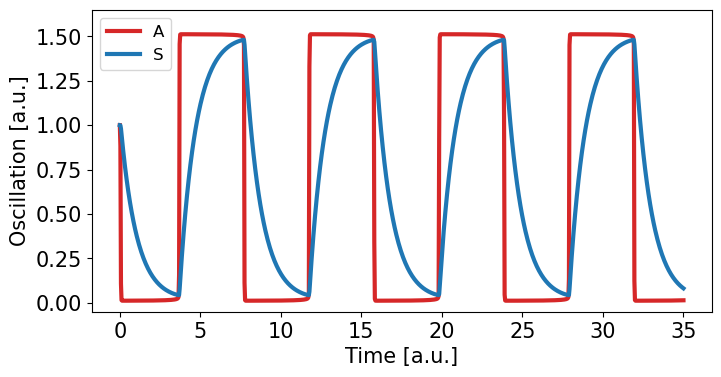

In [3]:
beta=1.5
rho=0.012
d=1
gamma=0.01
D = 0.01

t = np.linspace(0., 3500., 1000)
n_cells = 1
ap_positions = np.linspace(0.0, 1.0, n_cells)
init_vec = np.ones(n_cells*2)

names_plot = ['A', 'S']
colors_plot = ['tab:red', 'tab:blue']

results_osc = integrate(mein_derivs_1d, (np.min(t), np.max(t)), init_vec, method='RK45', t_eval=t, args=(beta, rho, d, D), rtol=1e-5).y
plt.figure(figsize = (8,4))
for i in range(2):
    plt.plot(t/100, results_osc[i], c = colors_plot[i], label = names_plot[i])
plt.legend()
plt.ylim([-0.05, 1.65])
plt.xlabel('Time [a.u.]')
plt.ylabel('Oscillation [a.u.]')
plt.show()

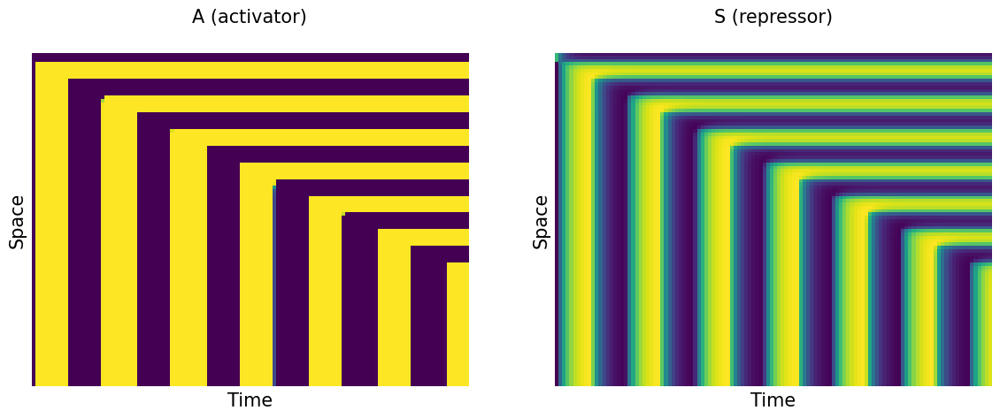

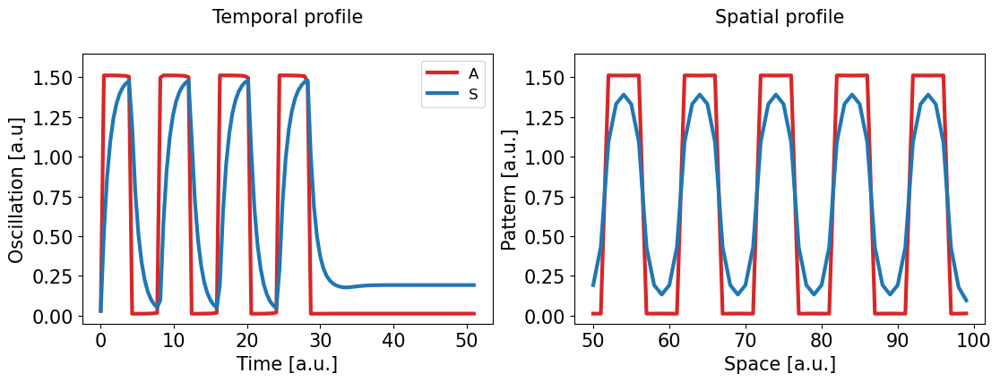

In [4]:
t = np.linspace(0., 5100., 120)
n_cells = 100

init_vec = 0.03*np.ones((2, n_cells))  #####
#we induce boundary in first 3 cells
for i in range(1,4):
    init_vec[1, -i] = 1.0

results = integrate(mein_derivs_1d, (np.min(t), np.max(t)), init_vec.flatten(), method='RK45', t_eval=t, args=(beta, rho, d, D), rtol=1e-5).y
results = np.reshape(results, (2, n_cells, -1))

fig, ax = plt.subplots(1, 2, figsize = (14,5))
plot_kymo(results[0], 'A (activator)', ax[0])
plot_kymo(results[1], 'S (repressor)', ax[1])
plt.show()

fig, ax = plt.subplots(1, 2, figsize = (13,4))
for i in range(2):
    ax[0].plot(t/100, results[i, 60], c = colors_plot[i], label = names_plot[i])
ax[0].legend()
ax[0].set_ylim([-0.05, 1.65])
ax[0].set_xlabel('Time [a.u.]')
ax[0].set_ylabel('Oscillation [a.u]')
ax[0].set_title('Temporal profile')

for i in range(2):
    ax[1].plot(np.arange(len(results[i, 50:, 110]))+50, results[i, 50:, 110], c = colors_plot[i], label = names_plot[i])
ax[1].set_ylim([-0.05, 1.65])
ax[1].set_xlabel('Space [a.u.]')
ax[1].set_ylabel('Pattern [a.u.]')
ax[1].set_title('Spatial profile')

# plt.legend()
plt.show()

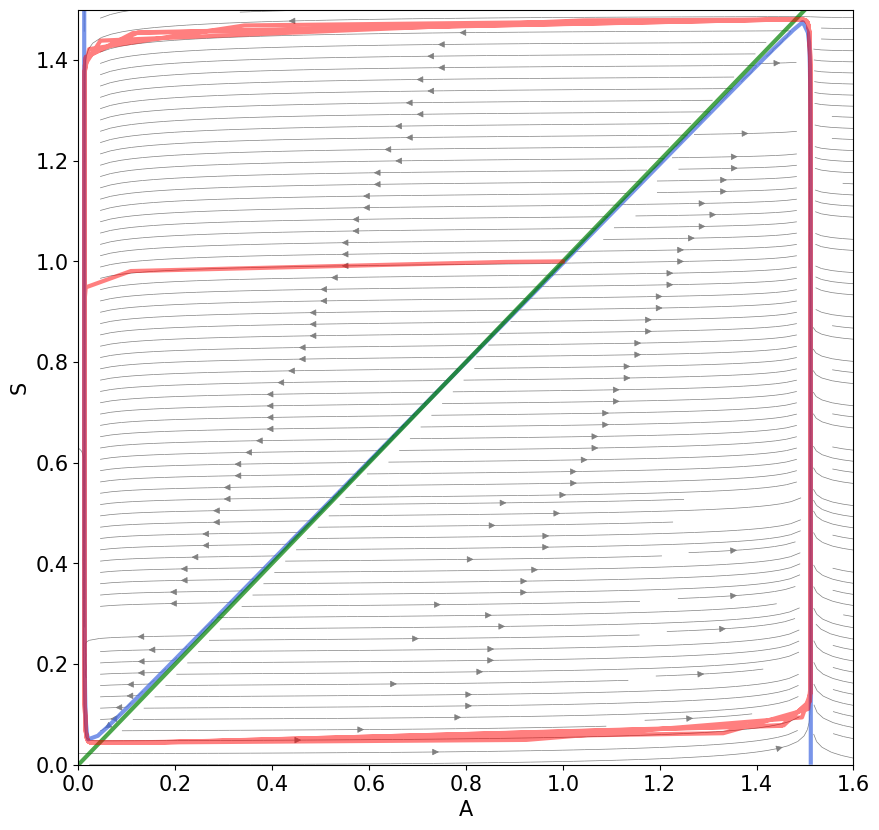

In [5]:


fig,ax=phase_plot(0,2.0,100,mein_derivs_1d, beta, rho, d, D)
npoints=100

ax.set_xlabel('A')
ax.set_ylabel('S')
ax.set_ylim([0, 1.5])
ax.set_xlim([0, 1.6])
ax.plot(results_osc[0,:],results_osc[1,:],  color='red', alpha=0.5)
plt.savefig('Meinhardt_phase_space.pdf')

## Meinhardt-Van der Pol model ( Hopf)




\begin{eqnarray}
\epsilon\frac{dA}{dt}&=& A-S+A^3/3\\
\frac{dS}{dt}&=& \lambda(A-\mu S)+ D \Delta S\\
\end{eqnarray}

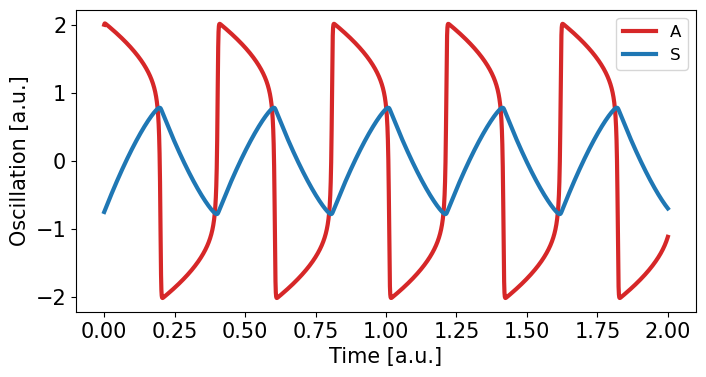

In [2]:

def vanderpol_derivs(vec,D):
    a = vec[0, :]
    s = vec[1, :]
    da=3*(-s+a-a**3./3)
    lambda_p=0.05
    bifurc=0.94*0
    ds=lambda_p*(a-0.1*s)+bifurc*lambda_p
    #Hopf at +0.094 for lambda_p=0.1 
    if len(a) > 1:
        ds += D*diffusion(s)  
    return np.array([da,ds]) #.T

def vanderpol_derivs_1d(t, y, D):
    vec = np.reshape(y, (2, -1))   
    derivs = vanderpol_derivs(vec,D)
    return derivs.flatten()   


D = 100

t = np.linspace(0., 200., 5000)
n_cells = 1
ap_positions = np.linspace(0.0, 1.0, n_cells)
init_vec = 2*np.ones(n_cells*2)
init_vec[1]=-0.75
names_plot = ['A', 'S']
colors_plot = ['tab:red', 'tab:blue']

results_osc = integrate(vanderpol_derivs_1d, (np.min(t), np.max(t)), init_vec, method='RK45', t_eval=t, args=( D, ), rtol=1e-5).y
plt.figure(figsize = (8,4))
for i in range(2):
    plt.plot(t/100, results_osc[i], c = colors_plot[i], label = names_plot[i])
plt.legend()
#plt.ylim([-4, 4])
plt.xlabel('Time [a.u.]')
plt.ylabel('Oscillation [a.u.]')
plt.show()



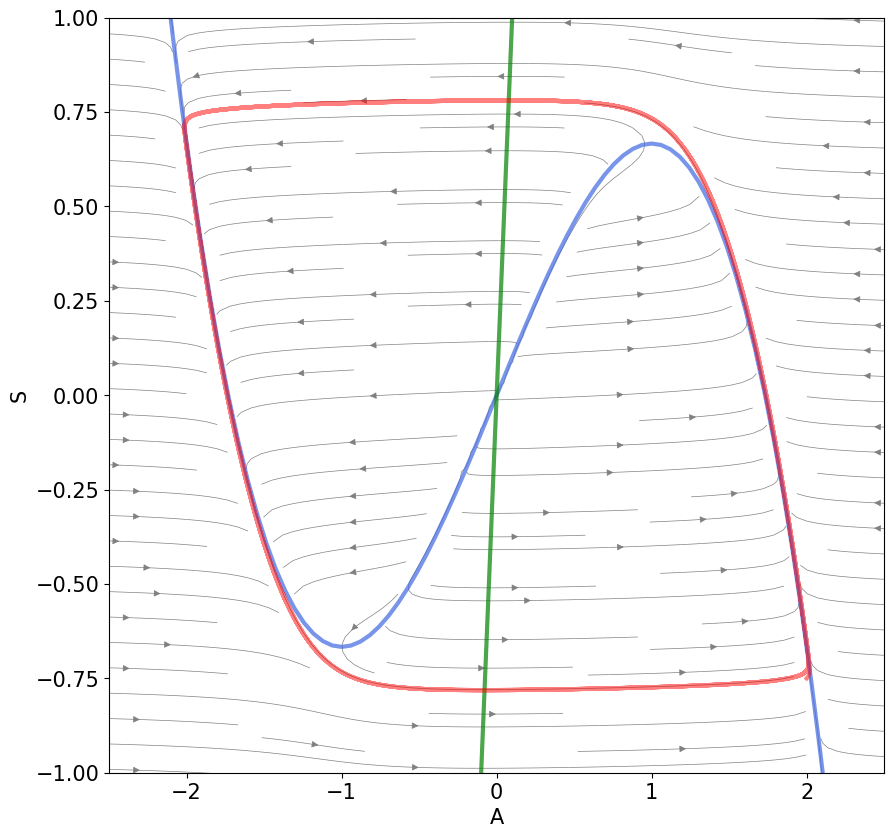

In [3]:
L=3
npoints=100

fig,ax=phase_plot(-L,L,npoints,vanderpol_derivs_1d,D)



ax.set_xlabel('A')
ax.set_ylabel('S')
ax.set_ylim([-1, 1])
ax.set_xlim([-2.5, 2.5])
ax.plot(results_osc[0,:],results_osc[1,:],  color='red', alpha=0.5)


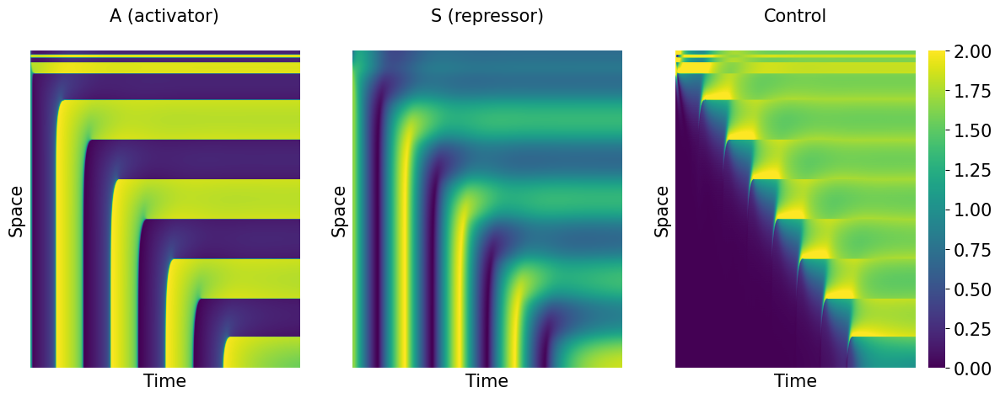

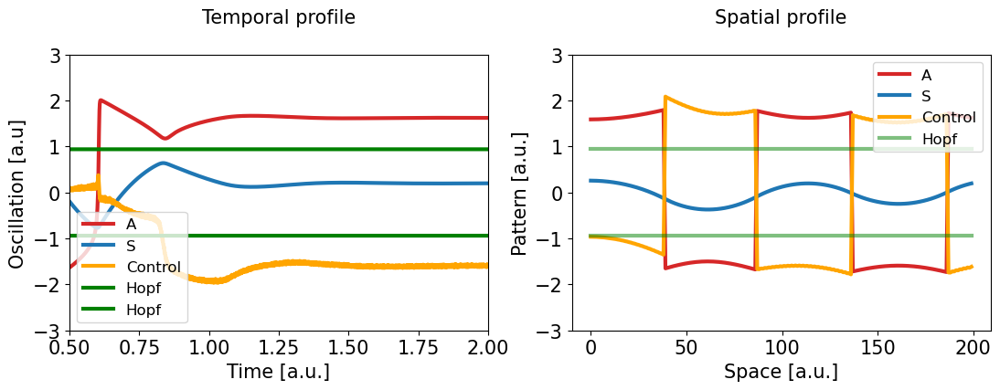

In [8]:
nstep=5000
t = np.linspace(0., 200., nstep)
n_cells = 400
lambda_p=0.05
bifurcation=0.94*lambda_p
init_vec = 0.5* np.ones((2, n_cells))  #####
#we induce boundary in first 3 cells
for i in range(1,7):
    init_vec[0, -i] = -0.5
    init_vec[1, -i] = -0.5
    init_vec[0, -i-10] = -0.5
    init_vec[1, -i-10] = -0.5

results = integrate(vanderpol_derivs_1d, (np.min(t), np.max(t)), init_vec.flatten(), method='RK45', t_eval=t, args=( D, ), rtol=1e-5).y
results = np.reshape(results, (2, n_cells, -1))


oscillation=np.zeros((n_cells,nstep))   
#print(oscillation)
for i in range(len(t)):
    variation=results[1,:,i]
    oscillation[:,i]=D*diffusion(variation)

fig, ax = plt.subplots(1, 3, figsize = (14,5))
plot_kymo(results[0], 'A (activator)', ax[0])
plot_kymo(results[1], 'S (repressor)', ax[1])
plot_kymo(np.abs(oscillation)/lambda_p,  'Control', ax[2],colorbar=True, vmin=0.0,vmax=2.0)
plt.savefig('Meinhardt_VDP_kymos.pdf')
plt.show()

fig, ax = plt.subplots(1, 2, figsize = (13,4))
n_cell_ref=int(n_cells/2)
dummy=np.ones((nstep,1))
for i in range(2):
    ax[0].plot(t/100, results[i,n_cell_ref], c = colors_plot[i], label = names_plot[i])
ax[0].plot(t/100, oscillation[n_cell_ref,:]/lambda_p, c='orange',label = 'Control')
ax[0].plot(t/100, 0.94*dummy, c='green',label = 'Hopf')
ax[0].plot(t/100, -0.94*dummy, c='green',label = 'Hopf')
ax[0].legend()
ax[0].set_ylim([-3, 3])
ax[0].set_xlim([0.5, 2.0])
ax[0].set_xlabel('Time [a.u.]')
ax[0].set_ylabel('Oscillation [a.u]')
ax[0].set_title('Temporal profile')


time=4000
dummy=np.ones((int(n_cells/2),1))
for i in range(2):
    ax[1].plot(np.arange(len(results[i, :int(n_cells/2), time])), results[i, :int(n_cells/2), time], c = colors_plot[i], label = names_plot[i])
#ax[1].plot(np.arange(len(results[1, :int(n_cells/2), time])), results[1, :int(n_cells/2), time]*8, c = colors_plot[1], label = names_plot[1])
ax[1].plot(np.arange(len(results[i, :int(n_cells/2), time])), oscillation[:int(n_cells/2),time]/lambda_p, c='orange',label = 'Control')
ax[1].plot(np.arange(len(results[i, :int(n_cells/2), time])), 0.94*dummy, c='green',label = 'Hopf', alpha=0.5)
ax[1].plot(np.arange(len(results[i, :int(n_cells/2), time])), -0.94*dummy, c='green', alpha=0.5)
ax[1].set_ylim([-3, 3])
ax[1].legend()
ax[1].set_xlabel('Space [a.u.]')
ax[1].set_ylabel('Pattern [a.u.]')
ax[1].set_title('Spatial profile')

# plt.legend()
#plt.show()
plt.savefig('Meinhardt_VDP.pdf')
plt.show()



## Meinhardt-Van der Pol model with SNIC




\begin{eqnarray}
\epsilon\frac{dA}{dt}&=& A-S+A^3/3\\
\frac{dS}{dt}&=& \lambda(A-\mu S)+ D \Delta S\\
\end{eqnarray}

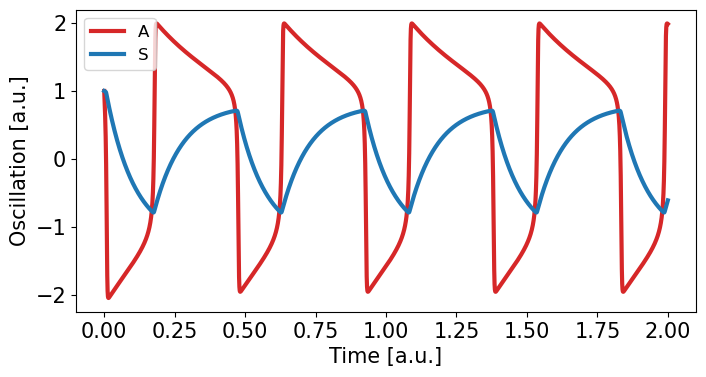

In [2]:

def vanderpol_derivs_snic(vec,D):
    a = vec[0, :]
    s = vec[1, :]
    da=3*(-s+a-a**3./3)
    ds=-0.02+0.1*np.tanh(3*a)-0.1*s
    if len(a) > 1:
        ds += D*diffusion(s)  
    return np.array([da,ds]) #.T

def vanderpol_derivs_snic_1d(t, y, D):
    vec = np.reshape(y, (2, -1))   
    derivs = vanderpol_derivs_snic(vec,D)
    return derivs.flatten()   


D = 10

t = np.linspace(0., 200., 5000)
n_cells = 1
ap_positions = np.linspace(0.0, 1.0, n_cells)
init_vec = np.ones(n_cells*2)

names_plot = ['A', 'S']
colors_plot = ['tab:red', 'tab:blue']

results_osc = integrate(vanderpol_derivs_snic_1d, (np.min(t), np.max(t)), init_vec, method='RK45', t_eval=t, args=( D, ), rtol=1e-5).y
plt.figure(figsize = (8,4))
for i in range(2):
    plt.plot(t/100, results_osc[i], c = colors_plot[i], label = names_plot[i])
plt.legend()
#plt.ylim([-4, 4])
plt.xlabel('Time [a.u.]')
plt.ylabel('Oscillation [a.u.]')
plt.show()



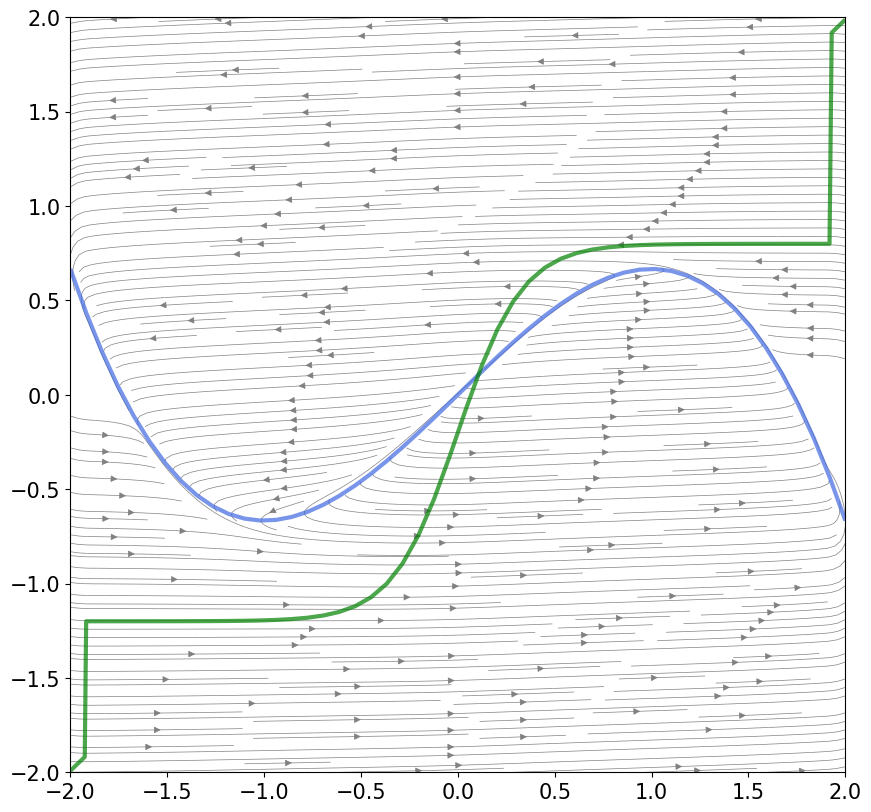

In [3]:
L=2
npoints=50

fig,ax=phase_plot(-L,L,npoints,vanderpol_derivs_snic_1d,D)



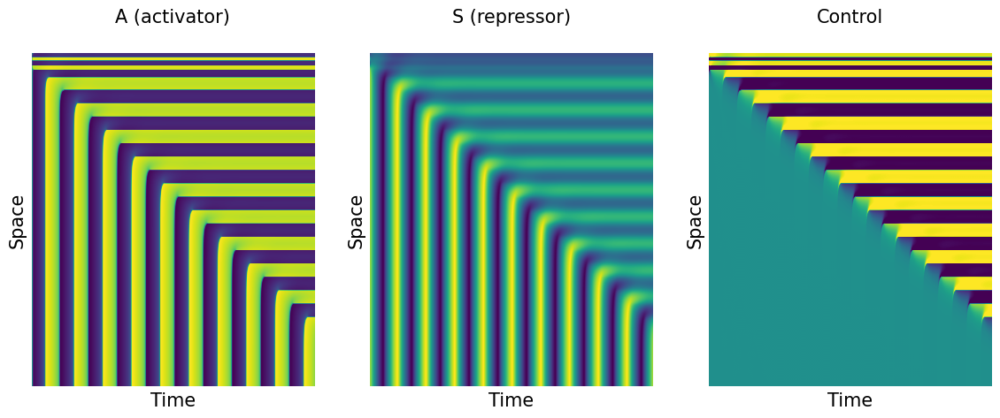

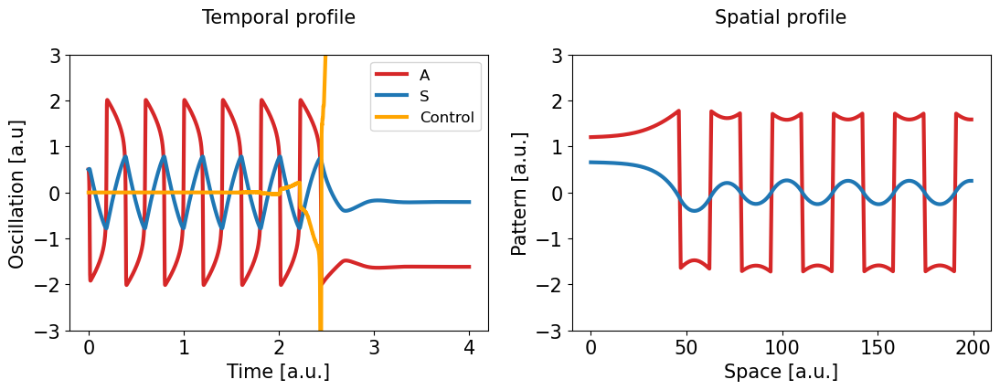

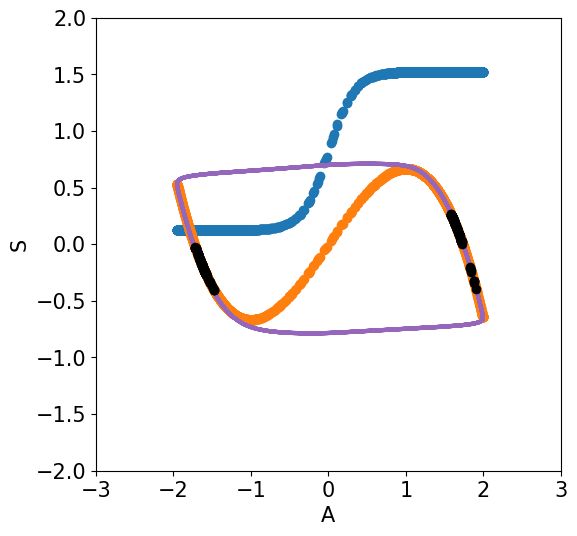

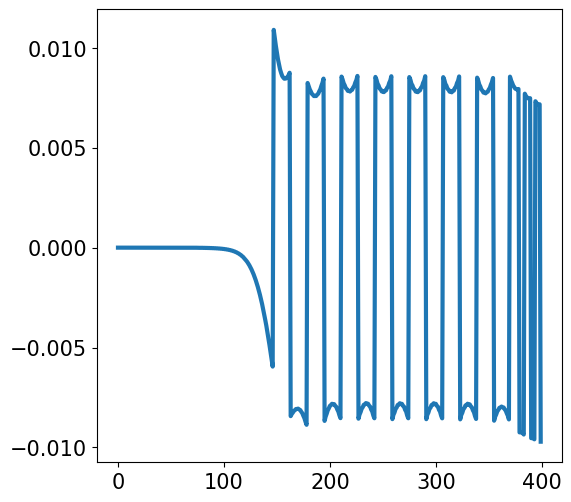

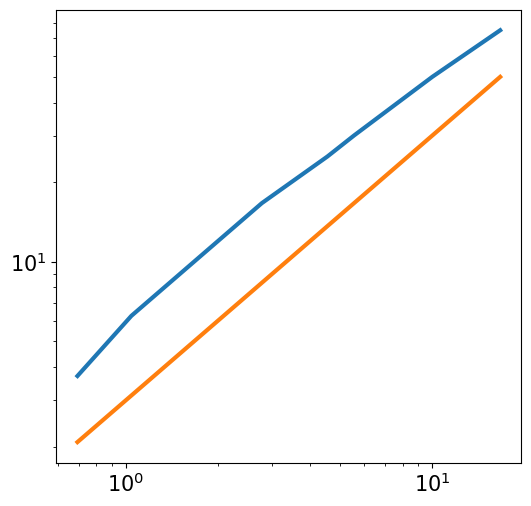

In [11]:
nstep=5000
t = np.linspace(0., 400., nstep)
n_cells = 400

init_vec = 0.5* np.ones((2, n_cells))  #####
#we induce boundary in first 3 cells
for i in range(1,7):
    init_vec[0, -i] = -0.5
    init_vec[1, -i] = -0.5
    init_vec[0, -i-10] = -0.5
    init_vec[1, -i-10] = -0.5

results = integrate(vanderpol_derivs_1d, (np.min(t), np.max(t)), init_vec.flatten(), method='RK45', t_eval=t, args=( D, ), rtol=1e-5).y
results = np.reshape(results, (2, n_cells, -1))
 
oscillation=np.zeros((n_cells,nstep))   
#print(oscillation)
for i in range(len(t)):
    variation=results[1,:,i]
    oscillation[:,i]=100*diffusion(variation)


fig, ax = plt.subplots(1, 3, figsize = (14,5))
plot_kymo(results[0], 'A (activator)', ax[0])
plot_kymo(results[1], 'S (repressor)', ax[1])
plot_kymo(oscillation, 'Control', ax[2],vmin=-0.8,vmax=0.8,)
plt.savefig('Meinhardt_VDP_kymos.pdf')
plt.show()

fig, ax = plt.subplots(1, 2, figsize = (13,4))
n_cell_ref=int(n_cells/2)-10
for i in range(2):
    ax[0].plot(t/100, results[i,n_cell_ref], c = colors_plot[i], label = names_plot[i])
ax[0].plot(t/100, 10*oscillation[n_cell_ref,:], c='orange',label = 'Control')
ax[0].legend()
ax[0].set_ylim([-3, 3])
ax[0].set_xlabel('Time [a.u.]')
ax[0].set_ylabel('Oscillation [a.u]')
ax[0].set_title('Temporal profile')

for i in range(2):
    ax[1].plot(np.arange(len(results[i, 100:int(n_cells/2)+100, 4000])), results[i, 100:int(n_cells/2)+100, 4000], c = colors_plot[i], label = names_plot[i])
ax[1].set_ylim([-3, 3])
ax[1].set_xlabel('Space [a.u.]')
ax[1].set_ylabel('Pattern [a.u.]')
ax[1].set_title('Spatial profile')


plt.savefig('Meinhardt_VDP.pdf')
plt.show()


plt.figure(figsize = (6,6))
x=results_osc[0, 3000:]
plt.plot(results_osc[0, 500:], results_osc[1, 500:], c = 'tab:purple')

oscillation=diffusion(results[1,:, 4000])
plt.scatter(x,0.7*np.tanh(3*x)+10*D*oscillation[int(n_cells/2)+13], marker='o')
plt.scatter(x, x-x**3/3, marker='o')
plt.scatter(results[0, int(n_cells/2):int(n_cells/2)+300, 4000], results[1, int(n_cells/2):int(n_cells/2)+300, 4000], marker='o', c = 'k', s = 35, zorder=5)
plt.xlim([-3, 3])
plt.ylim([-2, 2])
plt.xlabel('A')
plt.ylabel('S')
plt.show()

plt.figure(figsize = (6,6))
plt.plot(oscillation)
plt.show()



x_freq=np.array([0.06, 0.1,0.18, 0.22,0.36,0.6,0.96,1.44])
inv_wavelength=np.array([0.01333,0.02,0.0333,0.04,0.06,0.1,0.16,0.27])
plt.figure(figsize = (6,6))
plt.loglog(1.0/x_freq,1.0/inv_wavelength)
plt.loglog(1.0/x_freq,3*1.0/x_freq)


### Type I and Type II excitability


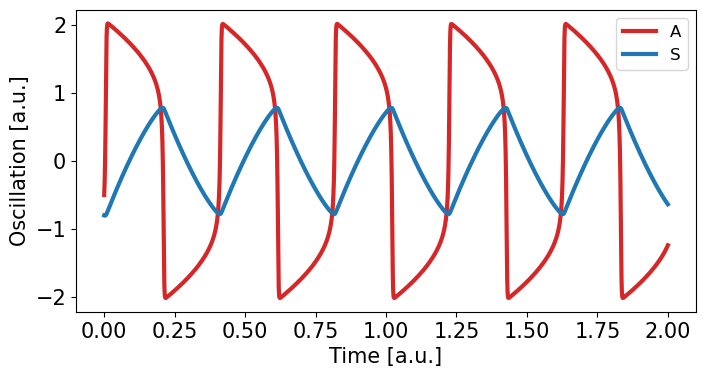

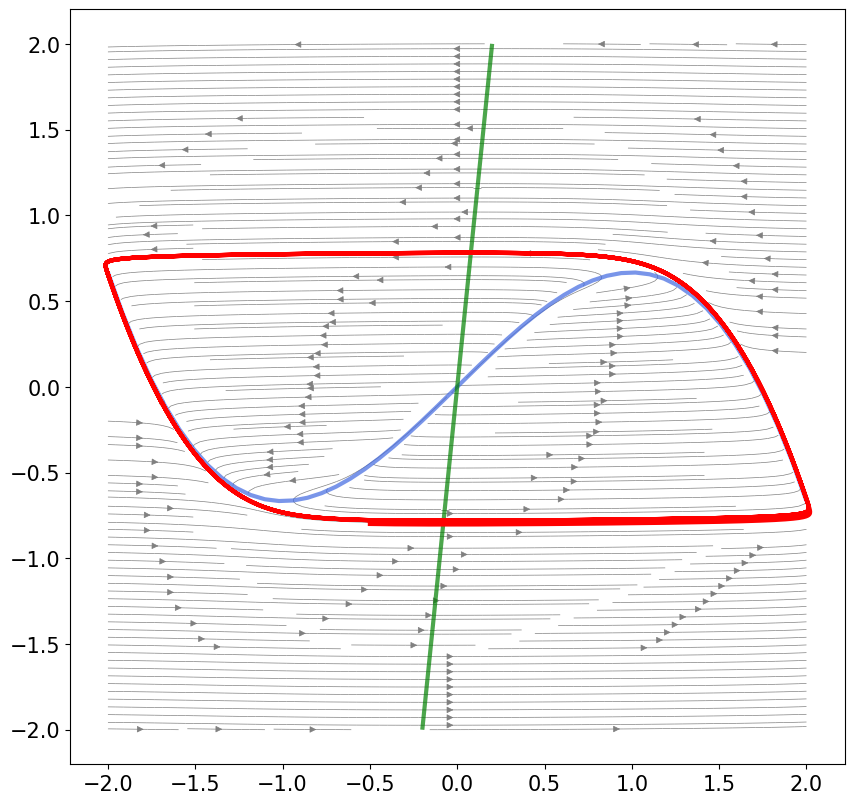

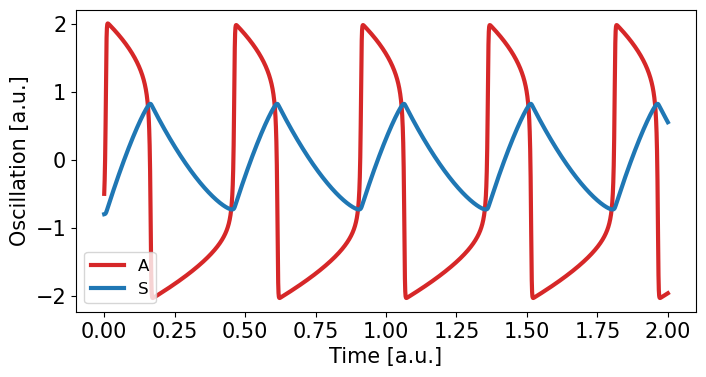

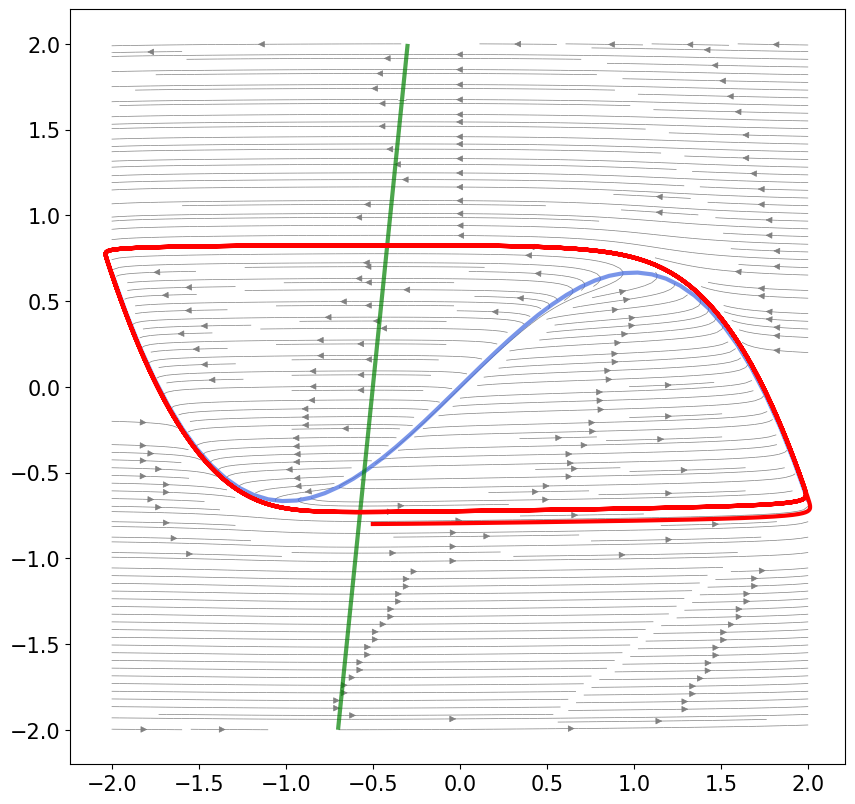

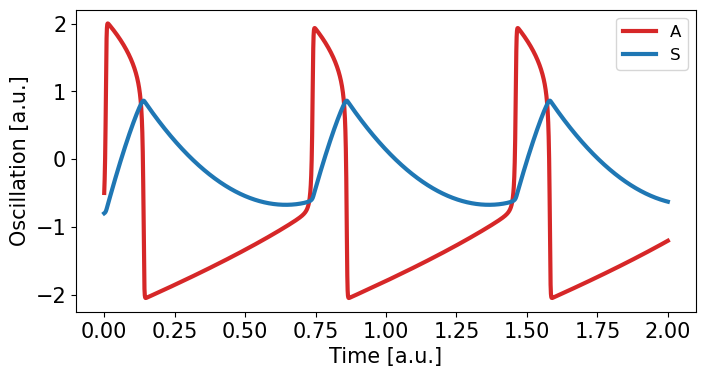

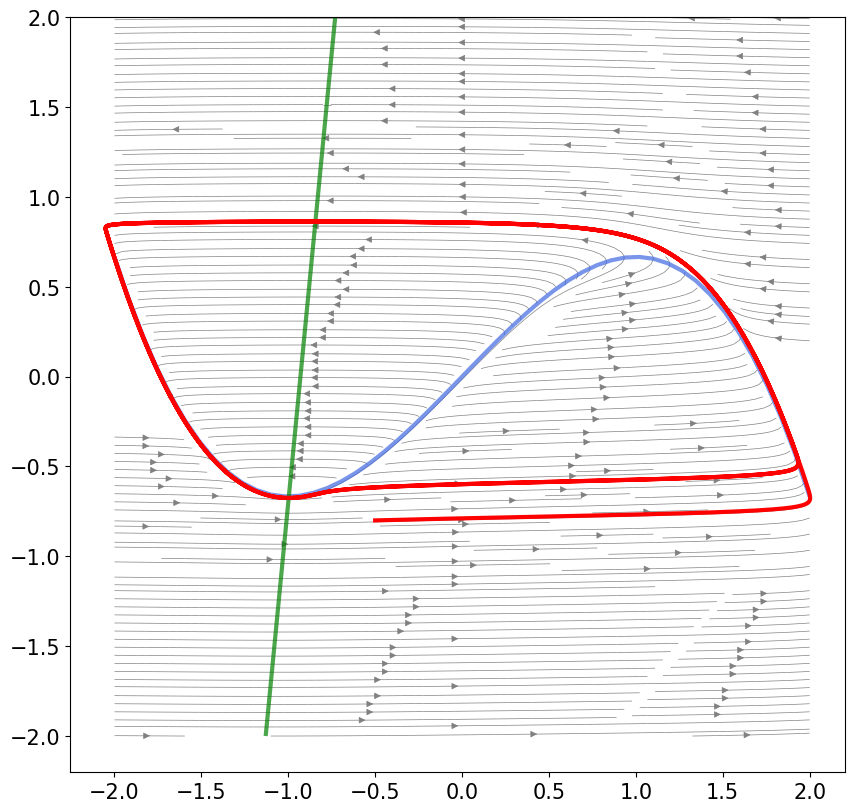

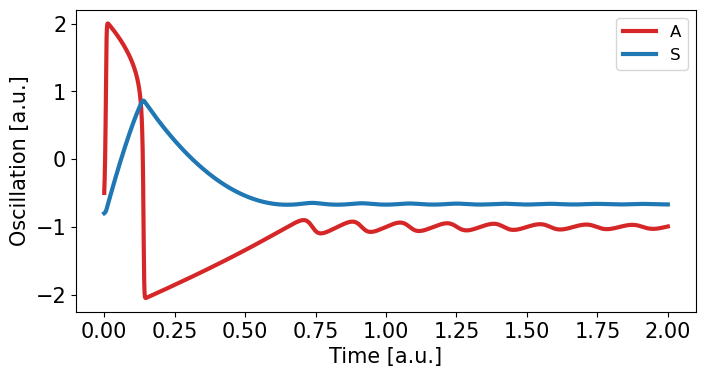

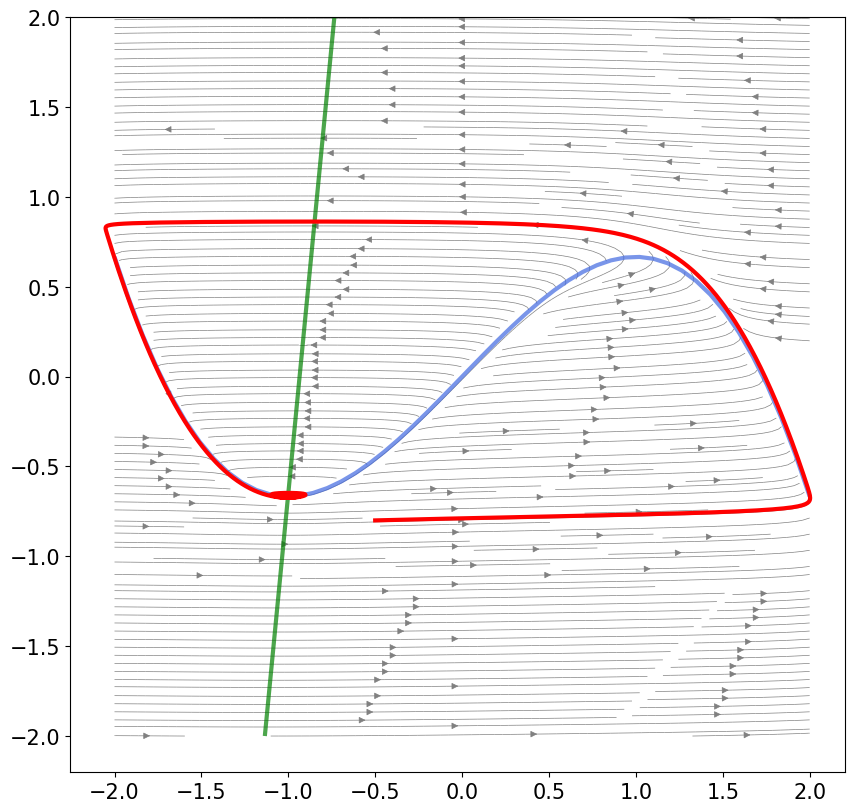

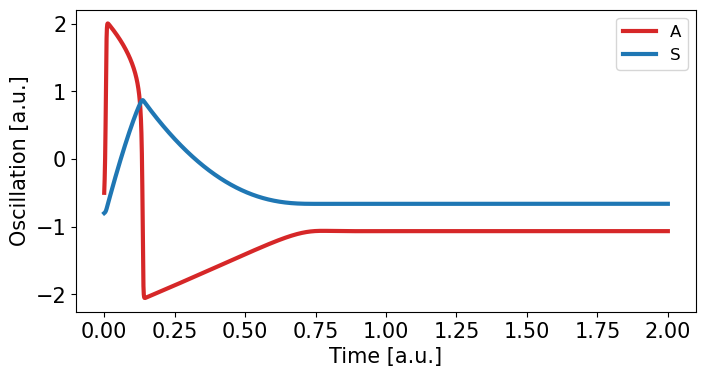

(<Figure size 1000x1000 with 1 Axes>, <AxesSubplot:>)

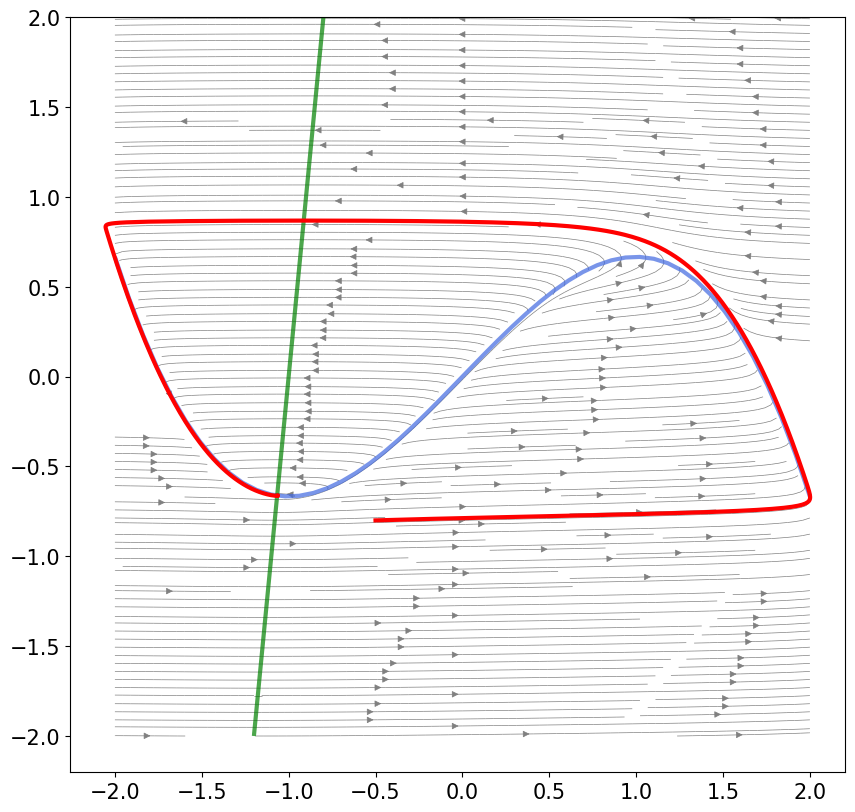

In [2]:
#Type II with Canard

def vanderpol_derivs(vec,bifurc):
    a = vec[0, :]
    s = vec[1, :]
    da=3*(-s+a-a**3./3)
    lambda_p=0.05
    ds=lambda_p*(a-0.1*s)+bifurc*lambda_p
    return np.array([da,ds]) #.T

def vanderpol_derivs_1d(t, y, h):
    vec = np.reshape(y, (2, -1))   
    derivs = vanderpol_derivs(vec,h)
    return derivs.flatten()   


#Type I


def vanderpol_derivs_snic(vec,bifurc):
    a = vec[0, :]
    s = vec[1, :]
    da=3*(-s+a-a**3./3)
    ds=bifurc+0.1*np.tanh(3*a)-0.1*s
 
    return np.array([da,ds]) #.T

def vanderpol_derivs_1d_snic(t, y, h):
    vec = np.reshape(y, (2, -1))   
    derivs = vanderpol_derivs_snic(vec,h)
    return derivs.flatten()   




    
init_vec = -0.5*np.ones(2)
init_vec[1]=-0.8
L=2
plot_excitable(vanderpol_derivs_1d,init_vec,L,0.0)  
plot_excitable(vanderpol_derivs_1d,init_vec,L,0.5) 
plot_excitable(vanderpol_derivs_1d,init_vec,L,0.93) 
plot_excitable(vanderpol_derivs_1d,init_vec,L,0.935) 
plot_excitable(vanderpol_derivs_1d,init_vec,L,1.0) 




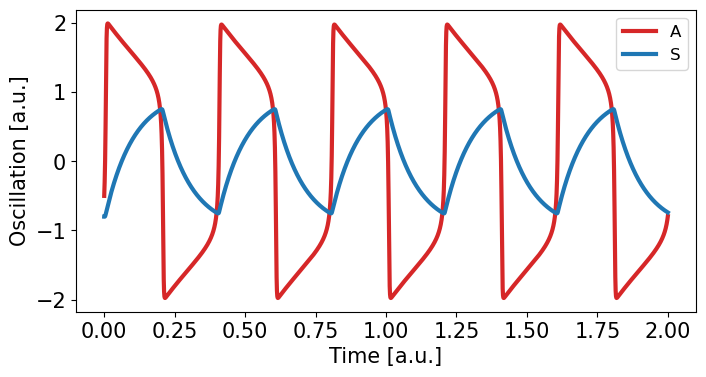

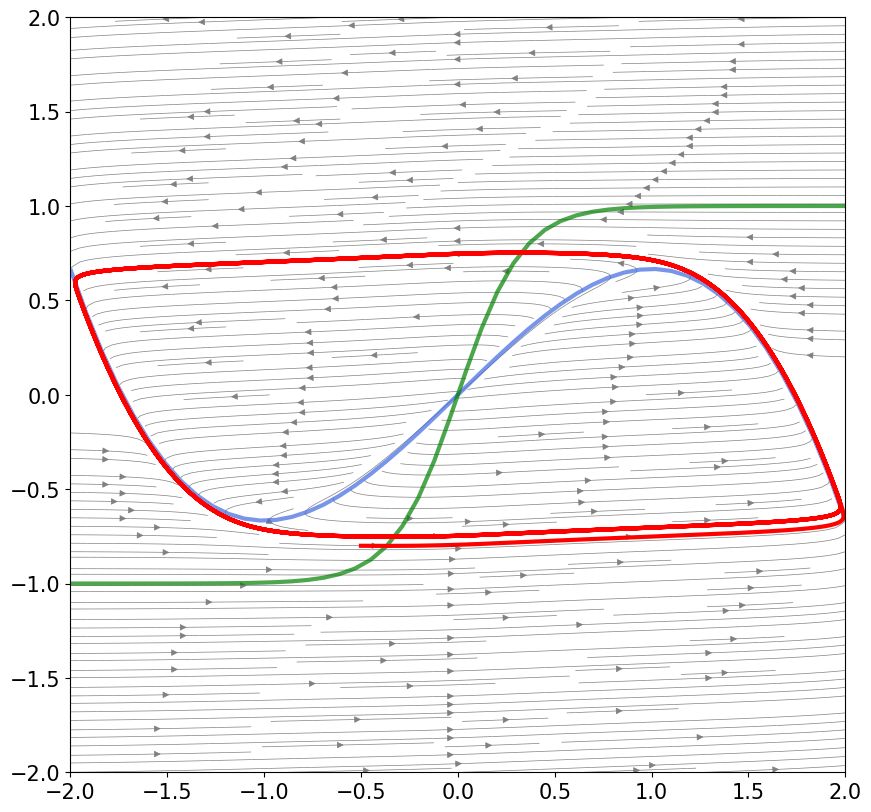

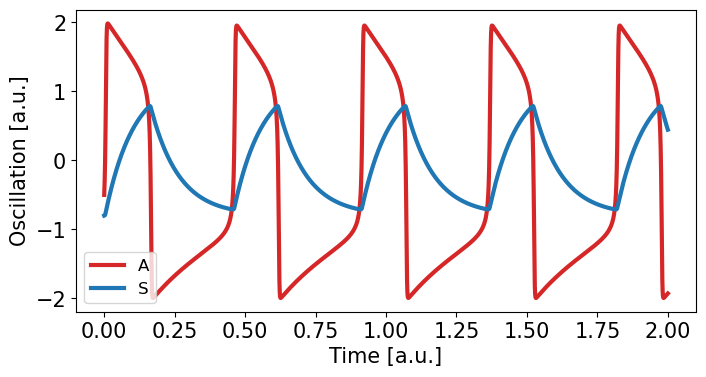

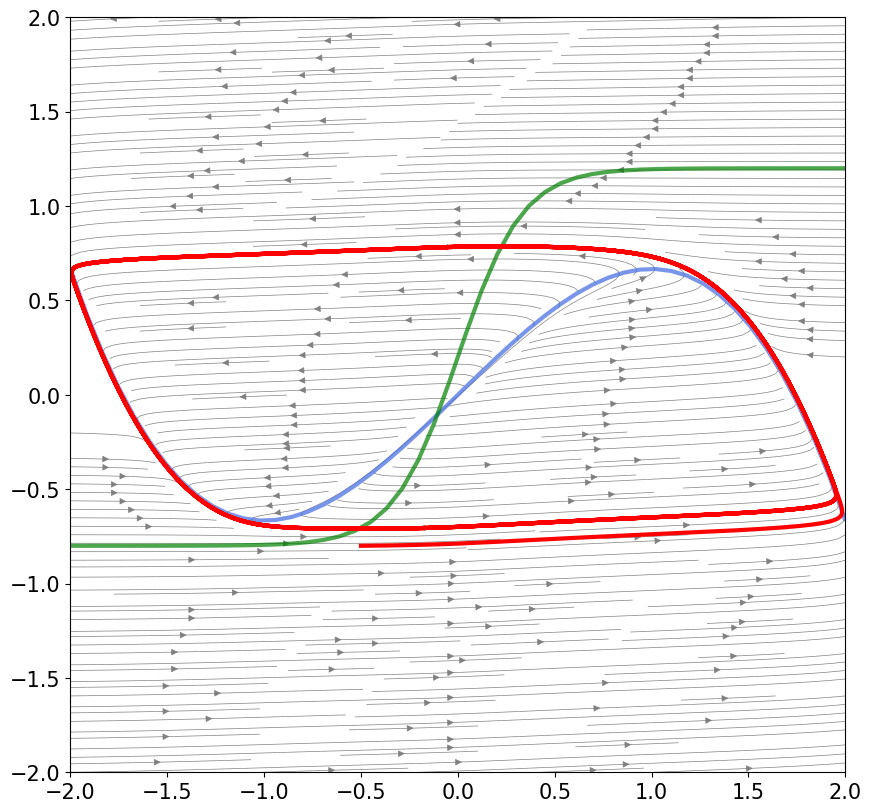

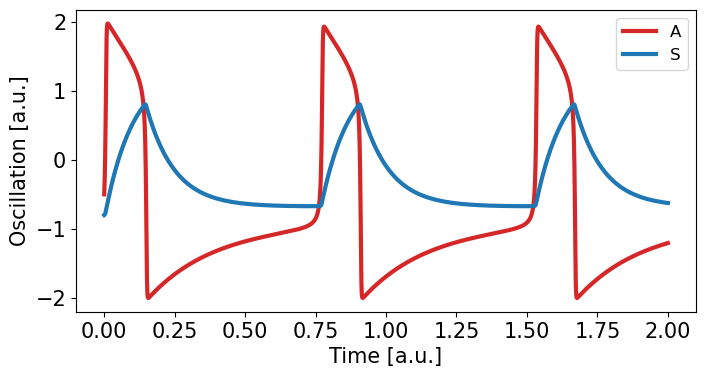

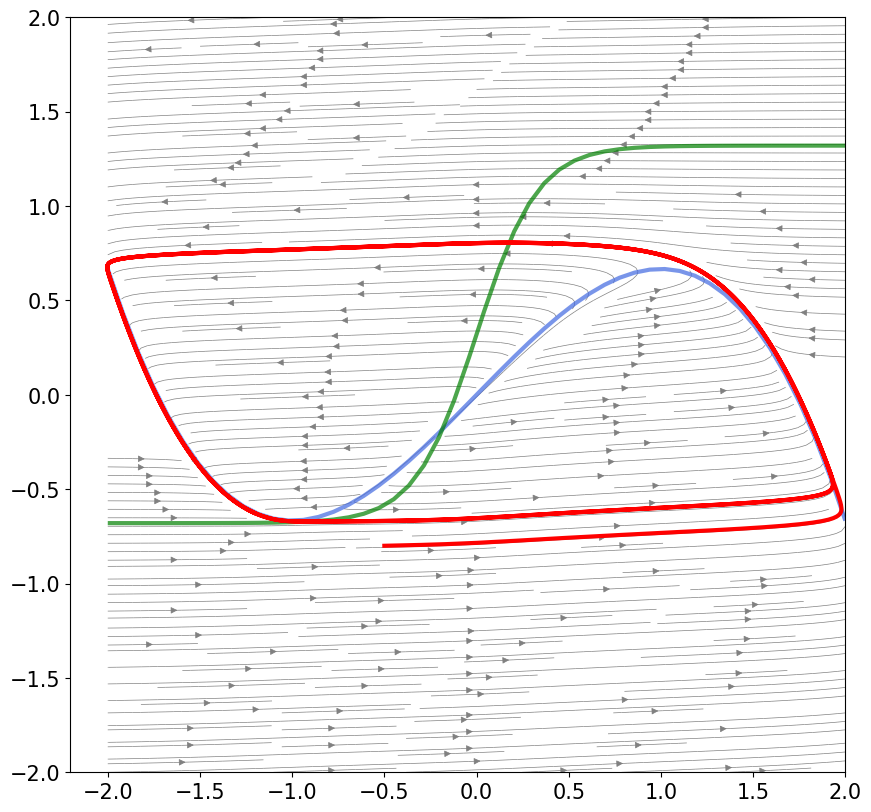

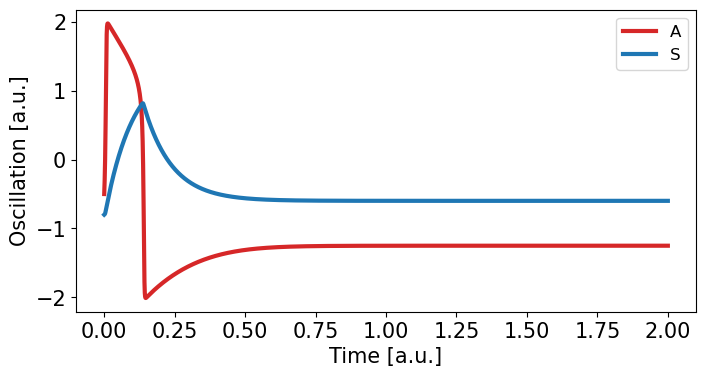

(<Figure size 1000x1000 with 1 Axes>, <AxesSubplot:>)

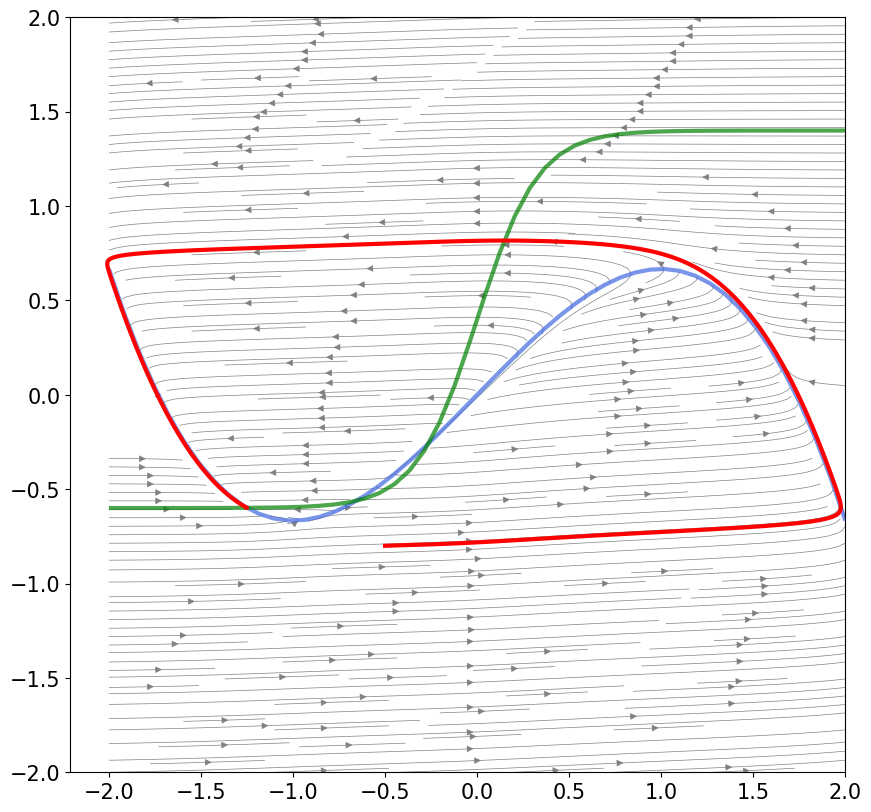

In [3]:
init_vec = -0.5*np.ones(2)
init_vec[1]=-0.8

plot_excitable(vanderpol_derivs_1d_snic,init_vec,L,+0.0)
plot_excitable(vanderpol_derivs_1d_snic,init_vec,L,+0.02)
plot_excitable(vanderpol_derivs_1d_snic,init_vec,L,+0.032)
plot_excitable(vanderpol_derivs_1d_snic,init_vec,L,+0.04)

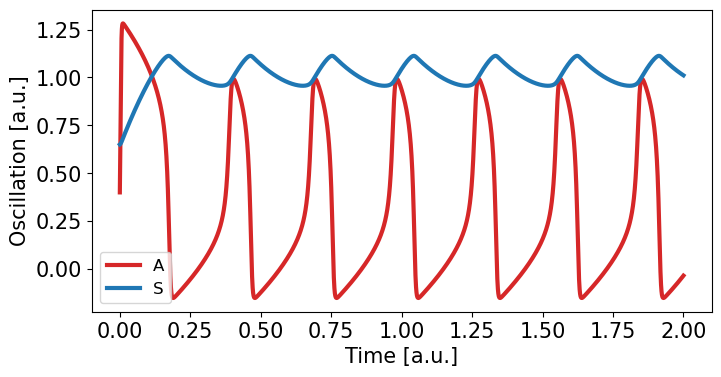

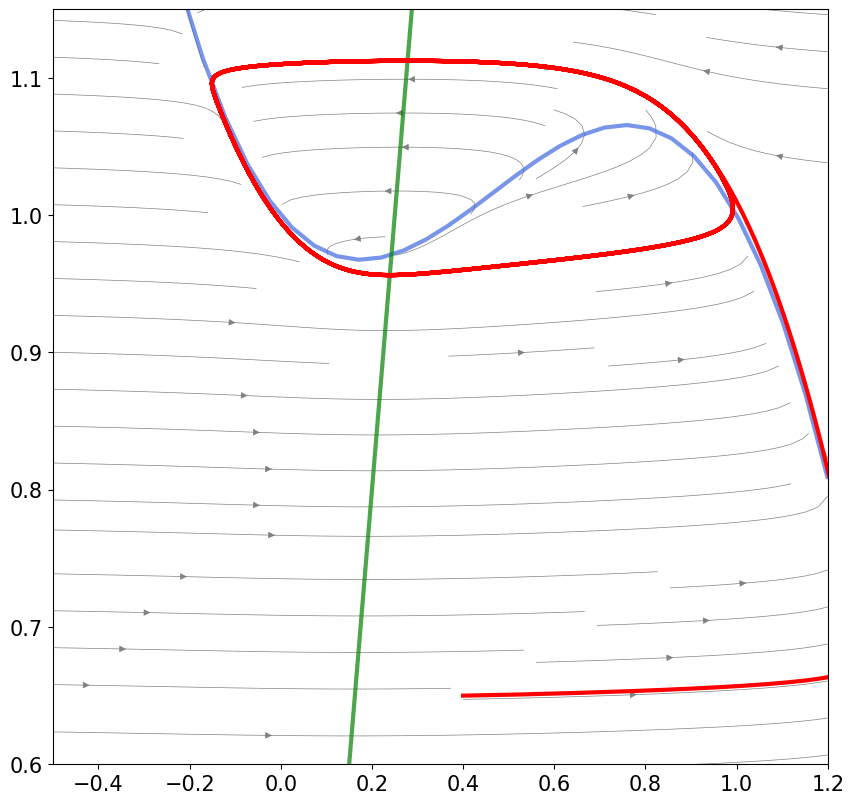

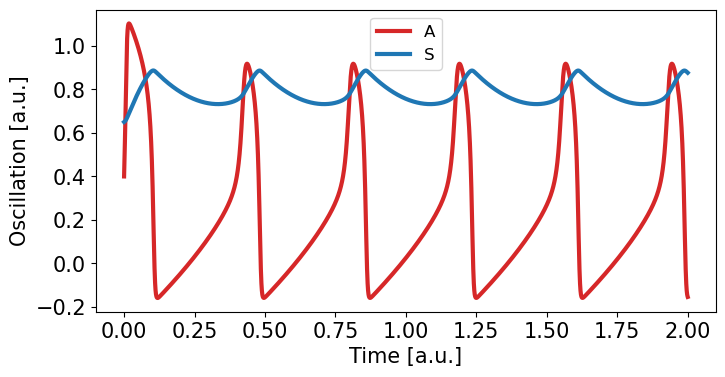

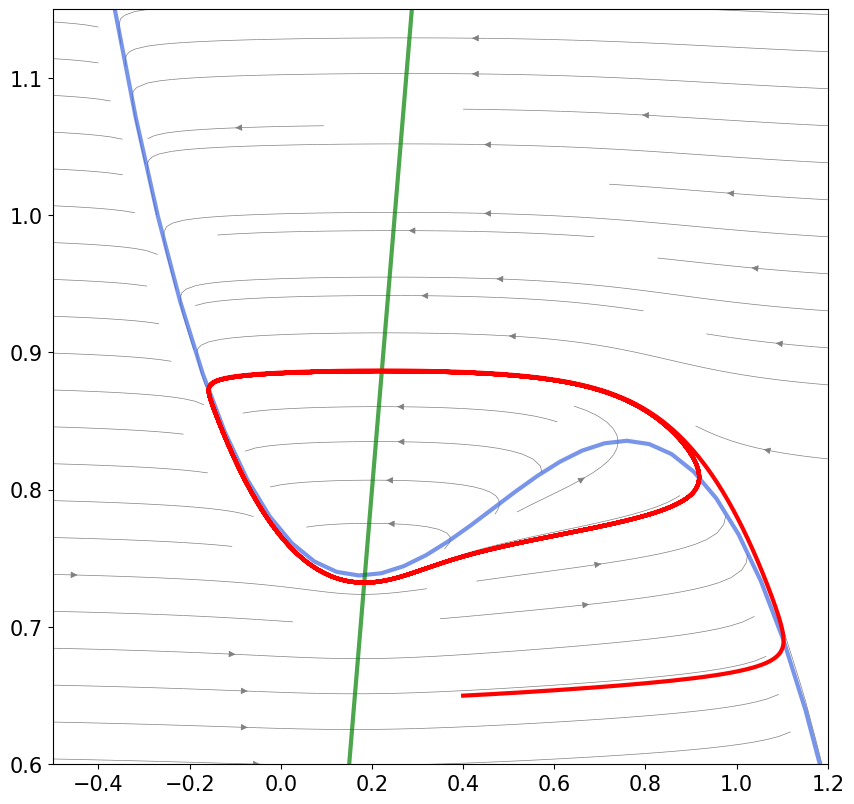

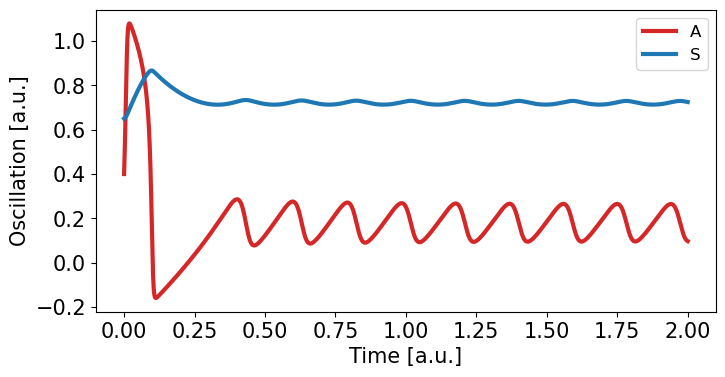

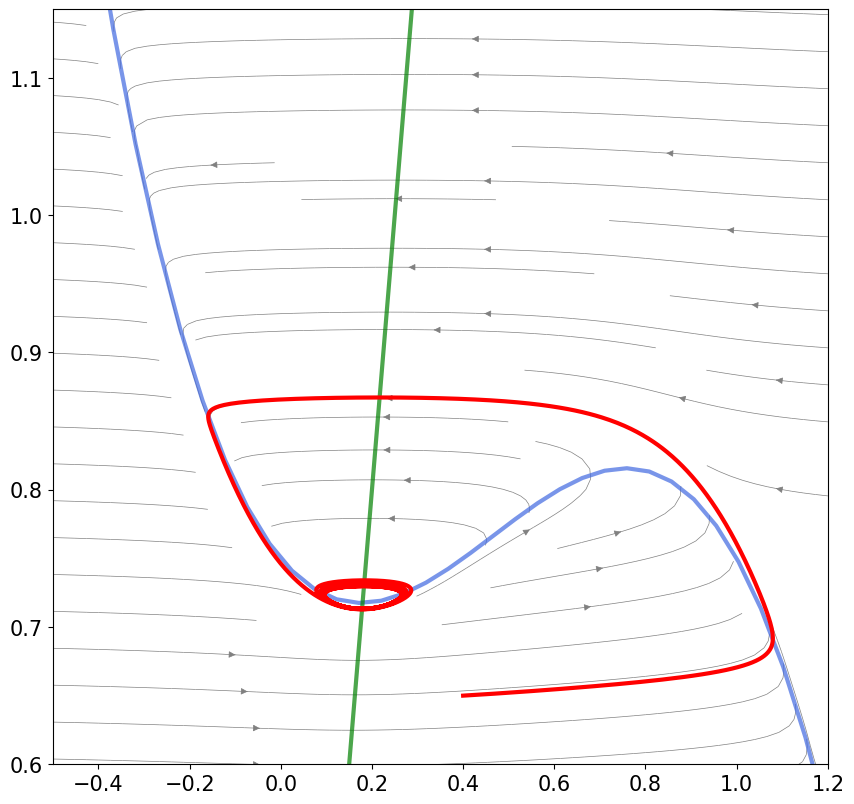

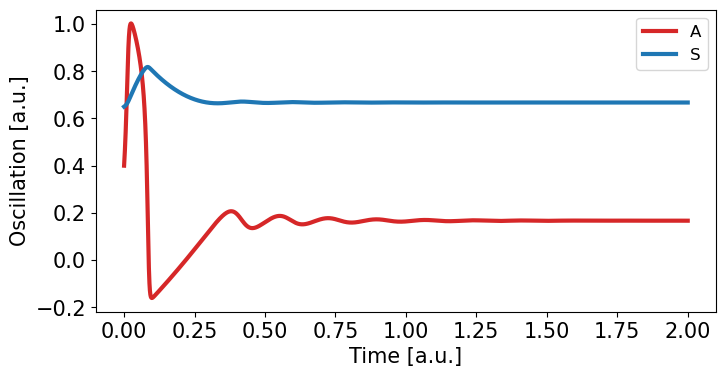

(0.6, 1.15)

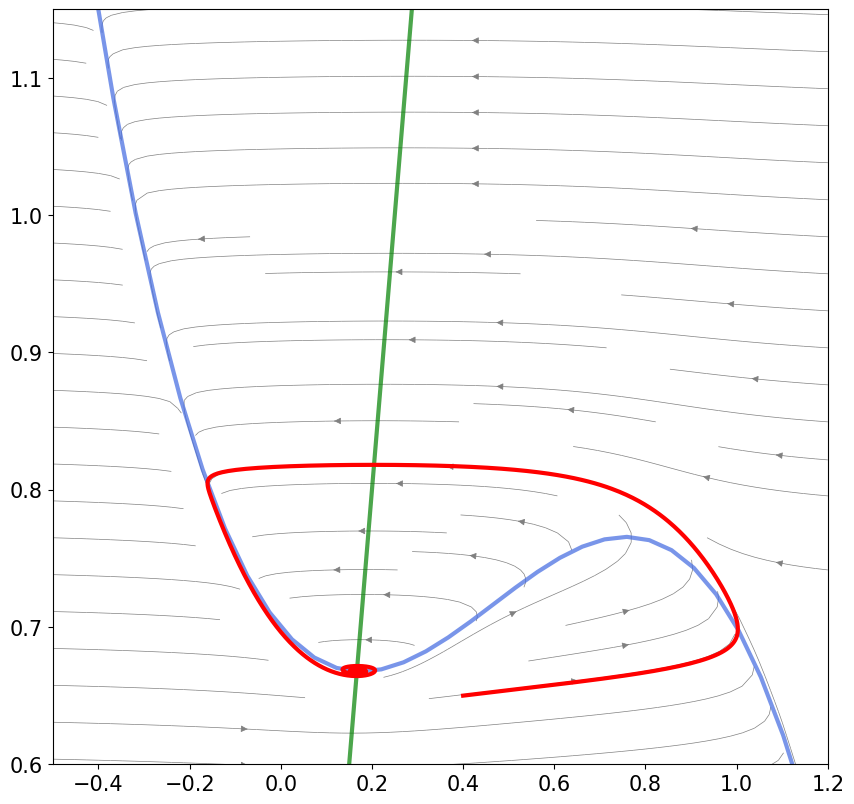

In [4]:
#Type II (model from Hubaud et al, Cell 2017)



def FitzHugh(vec,I):
    u = vec[0, :]
    v = vec[1, :]
    g=0.25
    a=0.4
    du=4*(u*(1-u)*(u-a)-v+I)
    dv=1.0/(30)*(u-g*v)
    return np.array([du,dv]) #.T

def FH_1d(t, y, h):
    vec = np.reshape(y, (2, -1))   
    derivs = FitzHugh(vec,h)
    return derivs.flatten()   

init_vec = np.zeros(2)
init_vec[0]=0.4
init_vec[1]=0.65

fig,ax=plot_excitable(FH_1d,init_vec,1.2,1.0)
ax.set_xlim([-0.5,1.2])
ax.set_ylim([0.6,1.15])

fig,ax=plot_excitable(FH_1d,init_vec,1.2,0.77)
ax.set_xlim([-0.5,1.2])
ax.set_ylim([0.6,1.15])


fig,ax=plot_excitable(FH_1d,init_vec,1.2,0.75)
ax.set_xlim([-0.5,1.2])
ax.set_ylim([0.6,1.15])

fig,ax=plot_excitable(FH_1d,init_vec,1.2,0.7)
ax.set_xlim([-0.5,1.2])
ax.set_ylim([0.6,1.15])

### PORD Model

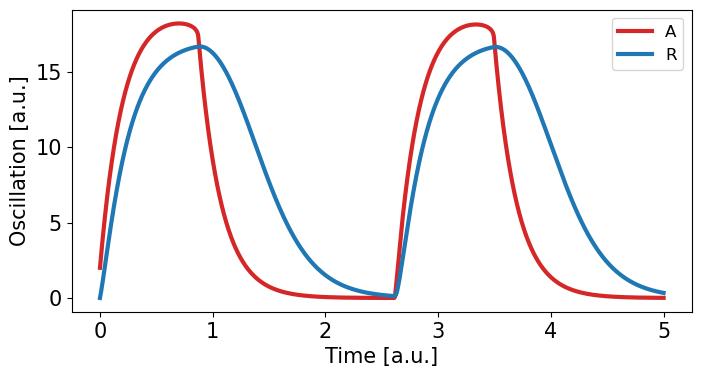

In [5]:

def phi(x):
    y=x/(x+1)
    #y=x
    y[x<0]=0
    return y


def PORD_derivs(vec,D):
    a = vec[0, :]
    s = vec[1, :]
    k1=7.68
    k2=8.04
    beta=0.5
    mu=0.05
    k3=0.31
    F=0.5
    x=k1*a-k2*s+F+beta
    #y=k1*a-k2*s+beta
    da=phi(x)-mu*a
    ds=k3*a/(1.0+k3*a)-mu*s
    if len(a) > 1:
        ds += D*diffusion(s)  
    return np.array([da,ds]) #.T

def PORD_derivs_1d(t, y, D):
    vec = np.reshape(y, (2, -1))   
    derivs = PORD_derivs(vec,D)
    return derivs.flatten()   


D = 10

t = np.linspace(0., 500, 5000)
n_cells = 1
ap_positions = np.linspace(0.0, 1.0, n_cells)
init_vec = 2*np.ones(n_cells*2)
init_vec[1]=0
names_plot = ['A', 'R']
colors_plot = ['tab:red', 'tab:blue']

results_osc = integrate(PORD_derivs_1d, (np.min(t), np.max(t)), init_vec, method='RK45', t_eval=t, args=( D, ), rtol=1e-5).y
plt.figure(figsize = (8,4))
for i in range(2):
    plt.plot(t/100, results_osc[i], c = colors_plot[i], label = names_plot[i])
plt.legend()
#plt.ylim([-4, 4])
plt.xlabel('Time [a.u.]')
plt.ylabel('Oscillation [a.u.]')
plt.show()


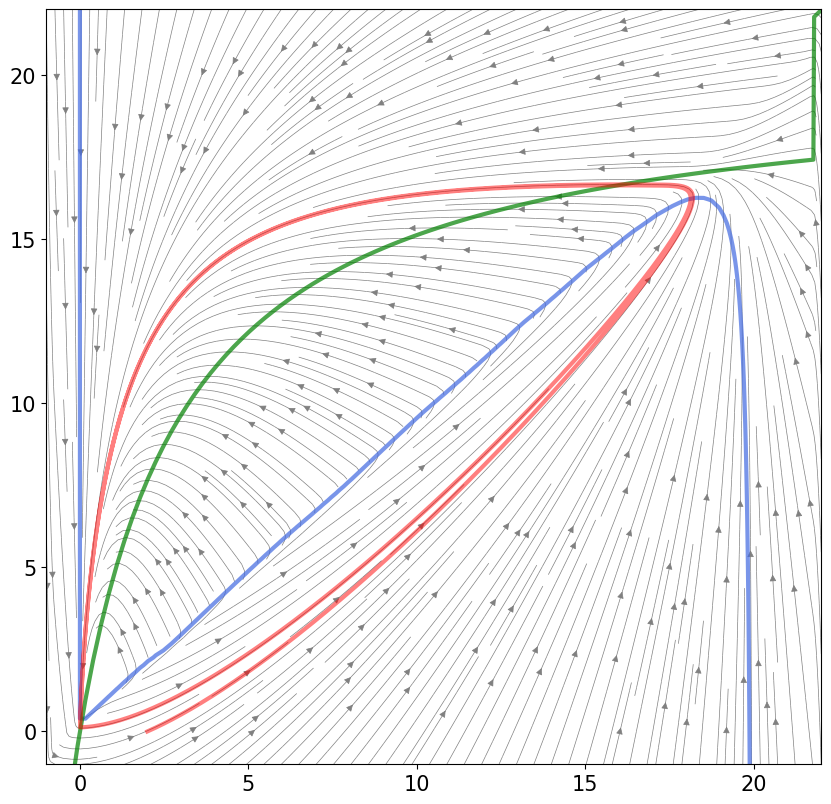

In [7]:

npoints=100

fig,ax=phase_plot(-1,22,npoints,PORD_derivs_1d,D)

ax.set_xlim([-1, 22])
ax.plot(results_osc[0,:],results_osc[1,:],  color='red', alpha=0.5)

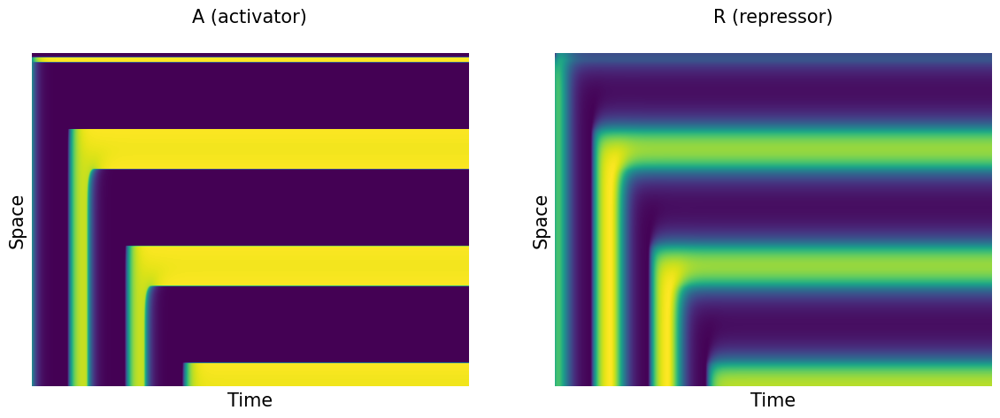

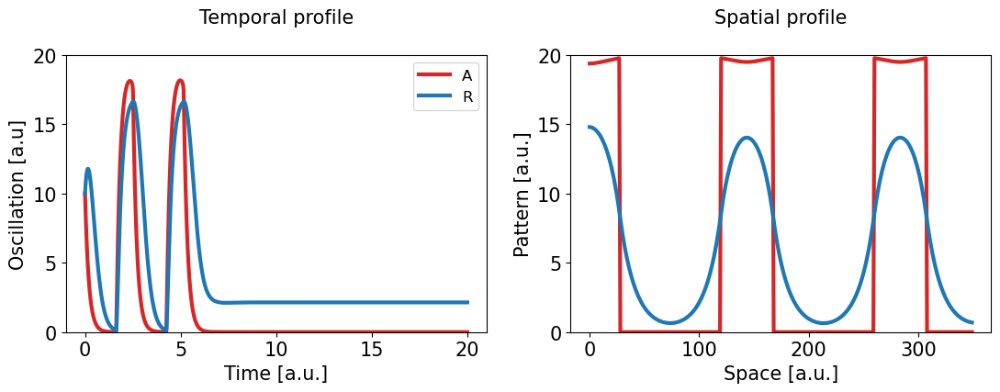

In [8]:
nstep=5000
t = np.linspace(0., 2000., nstep)
n_cells = 400

init_vec = 10* np.ones((2, n_cells))  #####
#we induce boundary in first 3 cells
for i in range(1,7):
    init_vec[0, -i] = 0.0
    init_vec[1, -i] = 0.0
    #init_vec[0, -i-10] = -0.5
    #init_vec[1, -i-10] = -0.5

results = integrate(PORD_derivs_1d, (np.min(t), np.max(t)), init_vec.flatten(), method='RK45', t_eval=t, args=( D, ), rtol=1e-5).y
results = np.reshape(results, (2, n_cells, -1))
 
#oscillation=np.zeros((n_cells,nstep))   
#print(oscillation)
for i in range(len(t)):
    variation=results[1,:,i]
    #oscillation[:,i]=100*diffusion(variation)


fig, ax = plt.subplots(1, 2, figsize = (14,5))
plot_kymo(results[0], 'A (activator)', ax[0])
plot_kymo(results[1], 'R (repressor)', ax[1])
#plot_kymo(oscillation, 'Control', ax[2],vmin=-0.8,vmax=0.8,)
plt.savefig('PORD_kymos.pdf')
plt.show()

fig, ax = plt.subplots(1, 2, figsize = (13,4))
n_cell_ref=int(n_cells/2)-100
for i in range(2):
    ax[0].plot(t/100, results[i,n_cell_ref], c = colors_plot[i], label = names_plot[i])
#ax[0].plot(t/100, 10*oscillation[n_cell_ref,:], c='orange',label = 'Control')
ax[0].legend()
ax[0].set_ylim([0, 20])
ax[0].set_xlabel('Time [a.u.]')
ax[0].set_ylabel('Oscillation [a.u]')
ax[0].set_title('Temporal profile')

for i in range(2):
    ax[1].plot(np.arange(len(results[i, 0:int(n_cells/2)+150, 4000])), results[i, 0:int(n_cells/2)+150, 4000], c = colors_plot[i], label = names_plot[i])
ax[1].set_ylim([0, 20])
ax[1].set_xlabel('Space [a.u.]')
ax[1].set_ylabel('Pattern [a.u.]')
ax[1].set_title('Spatial profile')

# plt.legend()
#plt.show()
plt.savefig('PORD.pdf')
plt.show()

## Cell-cycle model

In [9]:
def dconc_jump(t, conc, ap_positions, param):
    u = conc[0, :]
    v = conc[1, :]
    
    mu = param['mu']
    gamma = param['gamma']
    kappa = param['kappa']
    epsilon = param['epsilon']
    D = param['D']
    elongation_speed = param['elongation_speed']
    x1 = param['x1']
    x2 = param['x2']
    
    g_u = heaviside(elongation_speed*t - ap_positions + x1)
    g_v = heaviside(elongation_speed*t - ap_positions + x2)
    
    du = g_u * (u + mu*v)**2 / (gamma + kappa*u**2) - u/kappa
    dv = g_v * 1./(epsilon + u) - v + D*diffusion(v)
    return np.array([du, dv])

def heaviside(x):
    H = np.zeros(x.shape)
    H[x > 0.] = 1.
    return H
      
def dconc_1d(t, y, ap_positions, param):
    conc = np.reshape(y, (2, -1))   
    derivs = dconc_jump(t, conc, ap_positions, param)
    return derivs.flatten()

In [10]:
times = np.linspace(0, 600, 600)
n_cells = 50
ap_positions = np.linspace(1.0, 0.0, n_cells)
init_conc = np.zeros((2, n_cells))
# for i in range(10):
init_conc[0, -10:] = 1.0

param = { 'mu': 0.0001,
         'gamma': 0.01,
         'kappa': 10.,
         'epsilon': 0.001,
         'D': 60., 
         'elongation_speed': 0.00125,
         'x1': 0.4,
         'x2': 0.15
        }

results = integrate(dconc_1d, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions, param)).y
results = np.reshape(results, (2, n_cells, -1))

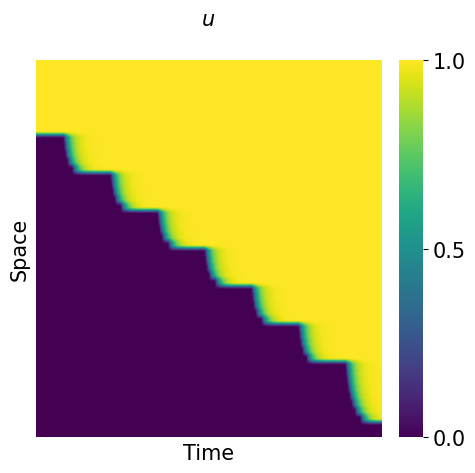

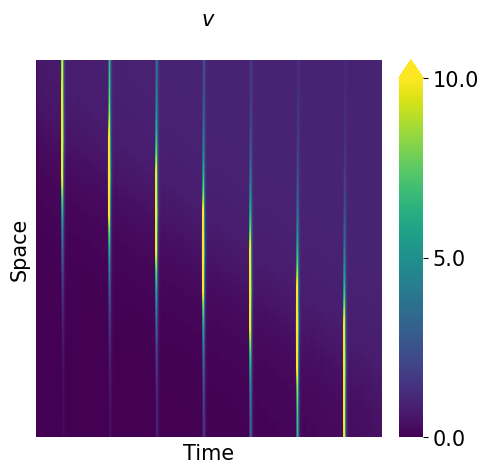

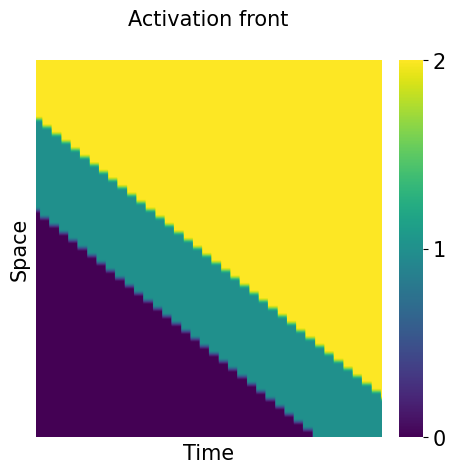

In [11]:
plot_kymo(results[0], r'$u$', colorbar=True, cb_ticks=[0, 0.5, 1.])
plot_kymo(results[1], r'$v$', vmin=0., vmax=10., colorbar=True, cb_ticks=[0., 5., 10., np.max(results[1])])

tt, xx = np.meshgrid(times, ap_positions)
g_u = heaviside(param['elongation_speed']*tt - xx + param['x1'])
g_v = heaviside(param['elongation_speed']*tt - xx + param['x2'])
plot_kymo(g_u+g_v, 'Activation front', colorbar=True, cb_ticks=[0, 1, 2])

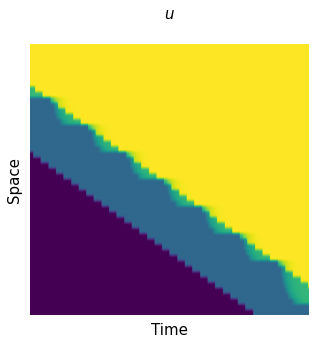

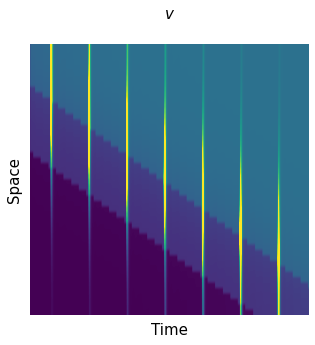

In [10]:
plot_kymo(results[0]+g_u+g_v, r'$u$')
plot_kymo(results[1]+g_u+g_v, r'$v$', vmin=0., vmax=8.)

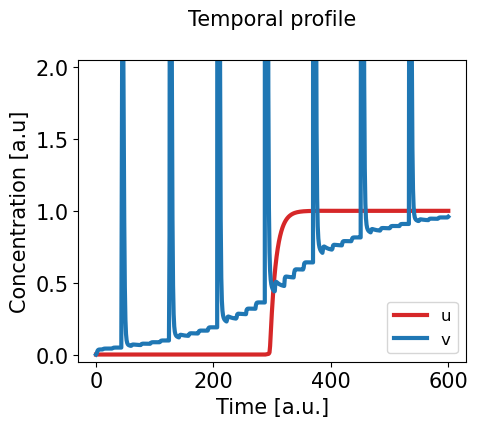

In [12]:
names_plot = ['u', 'v']
colors_plot = ['tab:red', 'tab:blue']

fig, ax = plt.subplots(1, 1, figsize = (5,4))
for i in range(2):
    # ax.plot(times, results[i, 29], c = colors_plot[i], label = names_plot[i])
    # ax.plot(times, results[i, 28], c = colors_plot[i], label = names_plot[i])
    # ax.plot(times, results[i, 26], c = colors_plot[i], label = names_plot[i])
    ax.plot(times, results[i, 22], c = colors_plot[i], label = names_plot[i])
ax.legend()
ax.set_ylim([-0.05, 2.05])
ax.set_xlabel('Time [a.u.]')
ax.set_ylabel('Concentration [a.u]')
ax.set_title('Temporal profile')
plt.show()

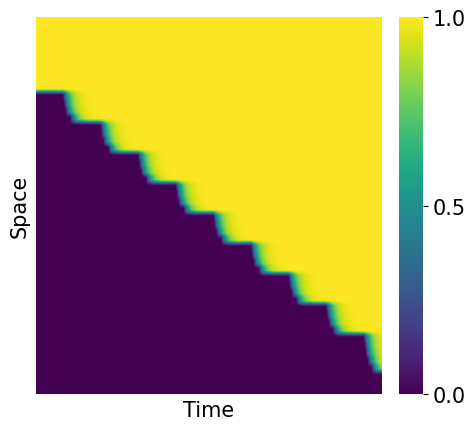

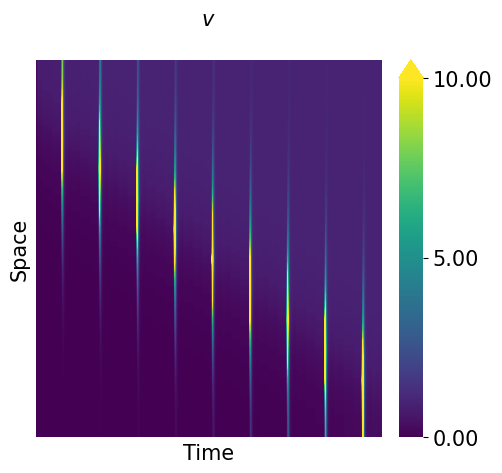

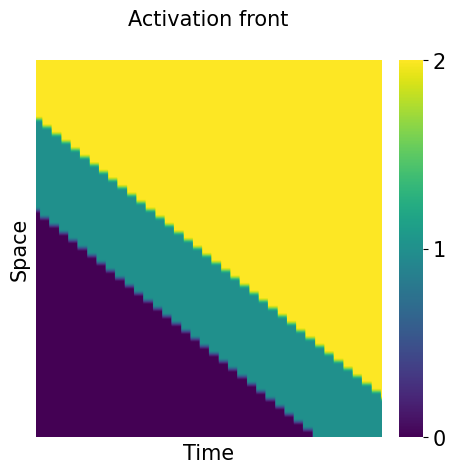

In [13]:
param = { 'mu': 0.0001,
         'gamma': 0.01,
         'kappa': 10.,
         'epsilon': 0.001,
         'D': 30., 
         'elongation_speed': 0.00125,
         'x1': 0.4,
         'x2': 0.15
        }

results = integrate(dconc_1d, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions, param)).y
results = np.reshape(results, (2, n_cells, -1))

plot_kymo(results[0], colorbar=True, cb_ticks=[0, 0.5, 1.])
plot_kymo(results[1], r'$v$', vmin=0., vmax=10., colorbar=True, cb_ticks=[0., 5., 10., np.max(results[1])])

tt, xx = np.meshgrid(times, ap_positions)
g_u = heaviside(param['elongation_speed']*tt - xx + param['x1'])
g_v = heaviside(param['elongation_speed']*tt - xx + param['x2'])
plot_kymo(g_u+g_v, 'Activation front', colorbar=True, cb_ticks=[0, 1, 2])

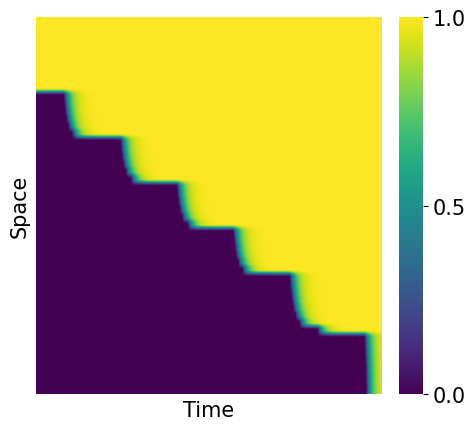

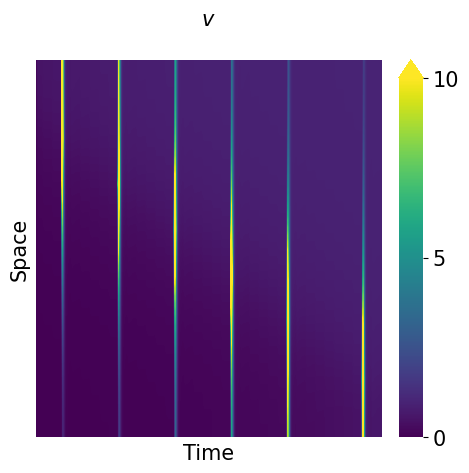

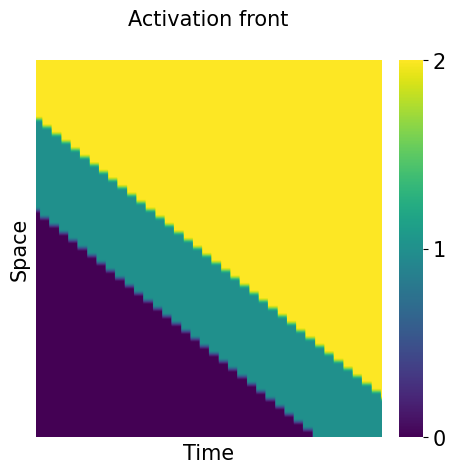

In [14]:
param = { 'mu': 0.0001,
         'gamma': 0.01,
         'kappa': 10.,
         'epsilon': 0.001,
         'D': 120., 
         'elongation_speed': 0.00125,
         'x1': 0.4,
         'x2': 0.15
        }

results = integrate(dconc_1d, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions, param)).y
results = np.reshape(results, (2, n_cells, -1))

plot_kymo(results[0], colorbar=True, cb_ticks=[0, 0.5, 1.])
plot_kymo(results[1], r'$v$', vmin=0., vmax=10., colorbar=True, cb_ticks=[0., 5., 10., np.max(results[1])])

tt, xx = np.meshgrid(times, ap_positions)
g_u = heaviside(param['elongation_speed']*tt - xx + param['x1'])
g_v = heaviside(param['elongation_speed']*tt - xx + param['x2'])
plot_kymo(g_u+g_v, 'Activation front', colorbar=True, cb_ticks=[0, 1, 2])

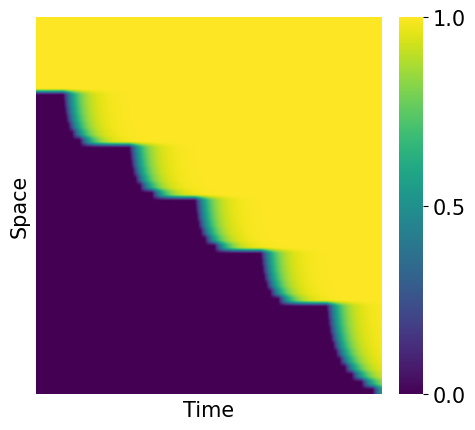

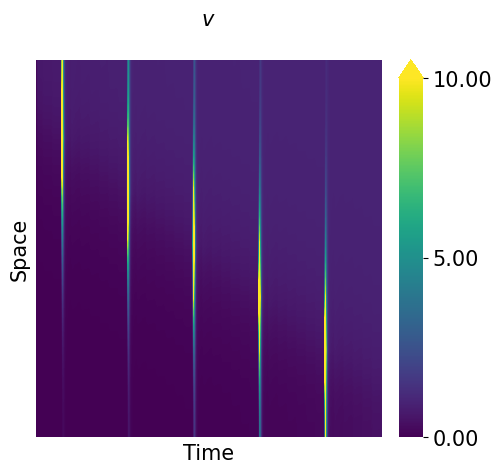

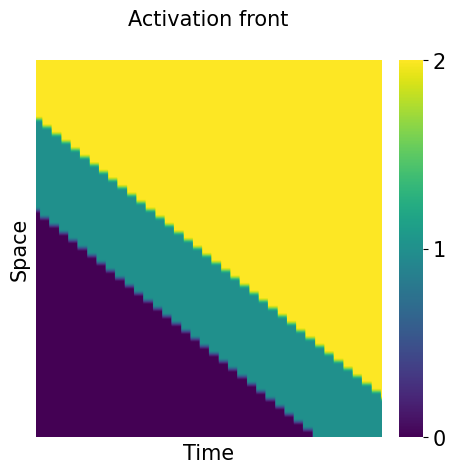

In [15]:
param = { 'mu': 0.0001,
         'gamma': 0.01,
         'kappa': 20.,
         'epsilon': 0.001,
         'D': 60., 
         'elongation_speed': 0.00125,
         'x1': 0.4,
         'x2': 0.15
        }

results = integrate(dconc_1d, (np.min(times), np.max(times)), init_conc.flatten(), method='LSODA', t_eval=times, args=(ap_positions, param)).y
results = np.reshape(results, (2, n_cells, -1))

plot_kymo(results[0], colorbar=True, cb_ticks=[0, 0.5, 1.])
plot_kymo(results[1], r'$v$', vmin=0., vmax=10., colorbar=True, cb_ticks=[0., 5., 10., np.max(results[1])])

tt, xx = np.meshgrid(times, ap_positions)
g_u = heaviside(param['elongation_speed']*tt - xx + param['x1'])
g_v = heaviside(param['elongation_speed']*tt - xx + param['x2'])
plot_kymo(g_u+g_v, 'Activation front', colorbar=True, cb_ticks=[0, 1, 2])

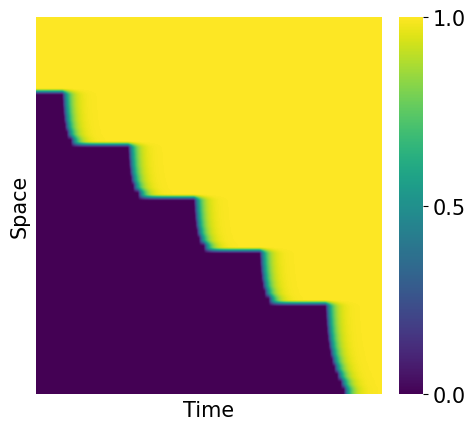

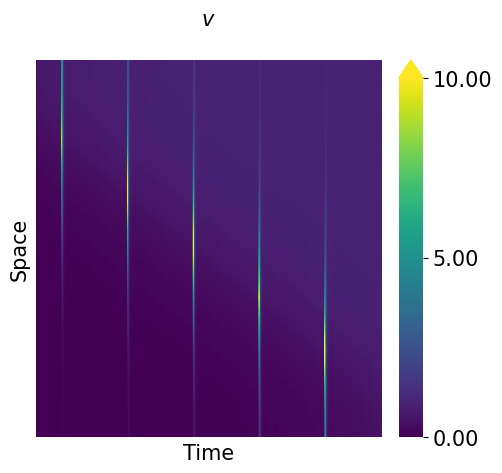

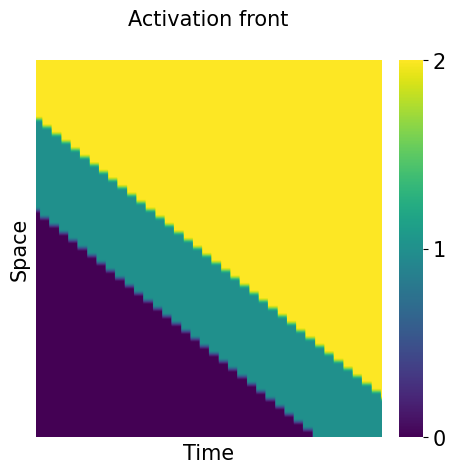

In [16]:
param = { 'mu': 0.0003,
         'gamma': 0.01,
         'kappa': 10.,
         'epsilon': 0.001,
         'D': 60., 
         'elongation_speed': 0.00125,
         'x1': 0.4,
         'x2': 0.15
        }

results = integrate(dconc_1d, (np.min(times), np.max(times)), init_conc.flatten(), method='RK45', t_eval=times, args=(ap_positions, param)).y
results = np.reshape(results, (2, n_cells, -1))

plot_kymo(results[0], colorbar=True, cb_ticks=[0, 0.5, 1.])
plot_kymo(results[1], r'$v$', vmin=0., vmax=10., colorbar=True, cb_ticks=[0., 5., 10., np.max(results[1])])

tt, xx = np.meshgrid(times, ap_positions)
g_u = heaviside(param['elongation_speed']*tt - xx + param['x1'])
g_v = heaviside(param['elongation_speed']*tt - xx + param['x2'])
plot_kymo(g_u+g_v, 'Activation front', colorbar=True, cb_ticks=[0, 1, 2])

## Julian Lewis phase model

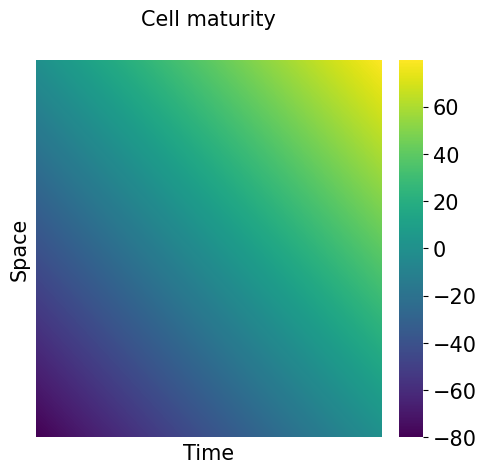

In [17]:
L = 80.
x = np.arange(-L, 0., .1)
t = np.arange(0., L, .1)
tt, xx = np.meshgrid(t, x, indexing='xy')
plot_kymo(xx+tt, 'Cell maturity', colorbar=True)


$ \dot \theta = r(m(x,t)) $


In [18]:
def r(m, sigma=1.):
    return (1. - np.tanh(m/sigma))/2.

def theta_dot(t, theta, x, sigma=1.):
    m = x + t 
    return r(m, sigma)

def analytic_solution(x,t, sigma=1.):
    return 1./2.*(t + sigma*np.log( (np.exp(x/sigma) + np.exp(-x/sigma)) / (np.exp((x+t)/sigma) + np.exp(-(x+t)/sigma)) ))

def asymptotic_solution(x,t, sigma=1.):
    return 1./2.*(t - x - sigma*np.log( (np.exp((x+t)/sigma) + np.exp(-(x+t)/sigma)) ))

def asymptotic_solution_m(m,t, sigma=1.):
    return t - m/2. - sigma/2.*np.log( (np.exp(m/sigma) + np.exp(-m/sigma)) )


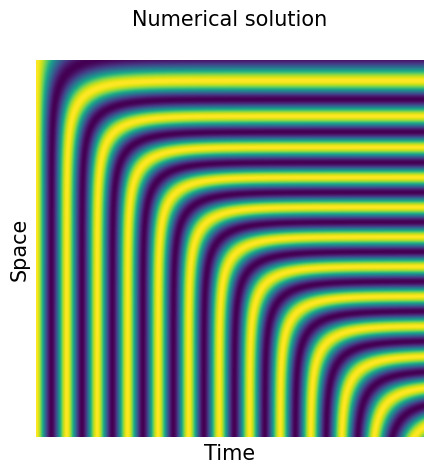

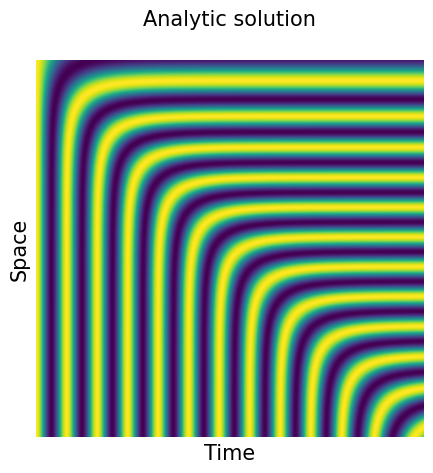

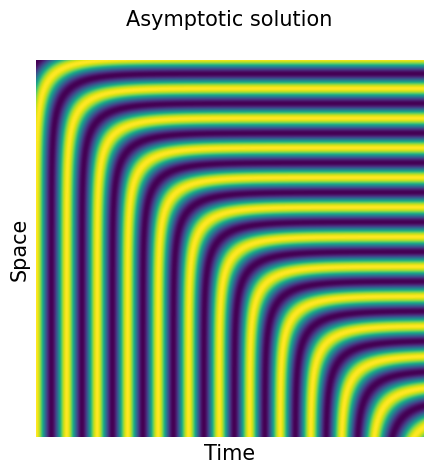

In [19]:
sigma = 10.
theta0 = np.zeros(len(x))

theta = np.zeros((len(x), len(t)))
for cell, x_loc in enumerate(x):
    theta[cell, :] = integrate(theta_dot, (np.min(t), np.max(t)), (theta0[cell],), method='LSODA', t_eval=t, args=(x_loc, sigma), rtol=1e-5).y

plot_kymo(np.cos(theta), 'Numerical solution')
plot_kymo(np.cos(analytic_solution(xx, tt, sigma)), 'Analytic solution')
plot_kymo(np.cos(asymptotic_solution(xx, tt, sigma)), 'Asymptotic solution')

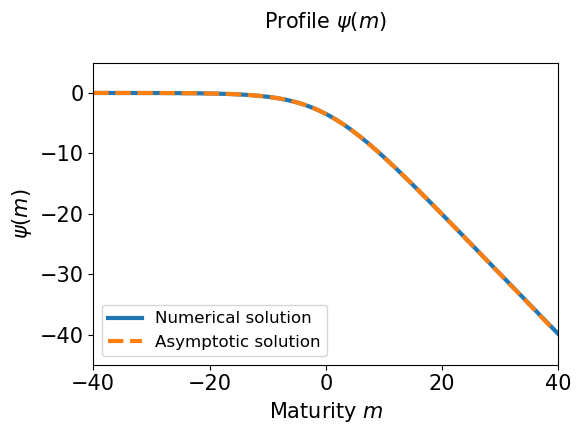

In [20]:
m = np.arange(-L/2, L/2, 1.)
plt.plot(x+t, theta[np.arange(len(x)),np.arange(len(t))]-t, label='Numerical solution')
plt.plot(m, asymptotic_solution(m, 0., 10.), '--', label='Asymptotic solution')
plt.xlim([-L/2, L/2])
plt.ylim([-45., 5.])
plt.title(r'Profile $\psi(m)$')
plt.xlabel(r'Maturity $m$')
plt.ylabel(r'$\psi(m)$')
# plt.xticks((-L/2, 0., L/2), ('-L/2', '0', 'L/2'))
# plt.yticks((-L/2, 0.), ('-L/2', '0'))
plt.legend()
plt.show()

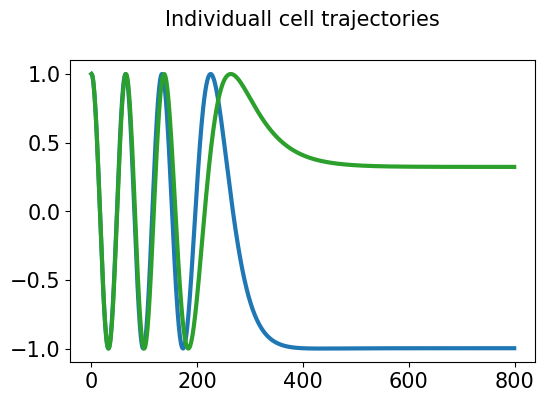

In [21]:
# plt.plot(np.cos(theta[-150, :]))
plt.plot(np.cos(theta[-220, :]))
plt.plot(np.cos(theta[-200, :]), c ='tab:green')
plt.title('Individuall cell trajectories')
plt.show()

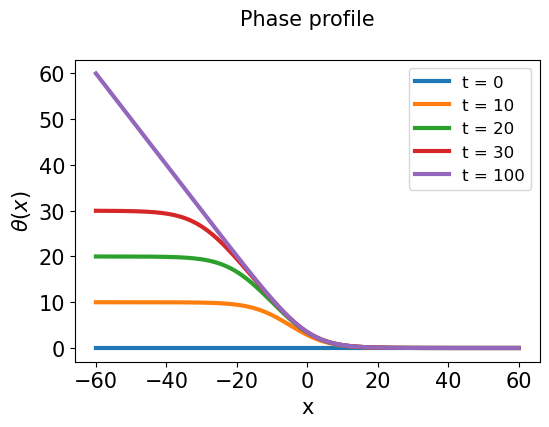

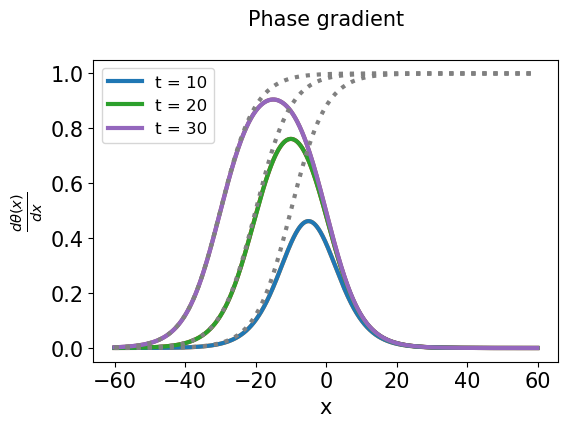

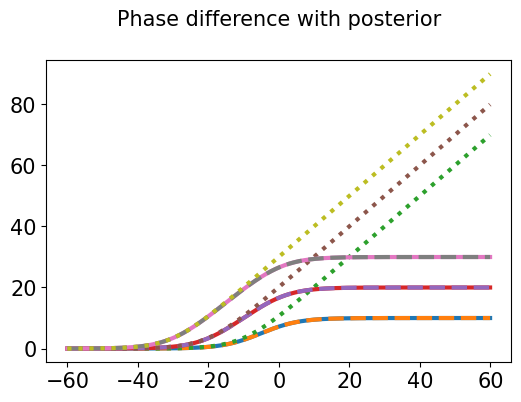

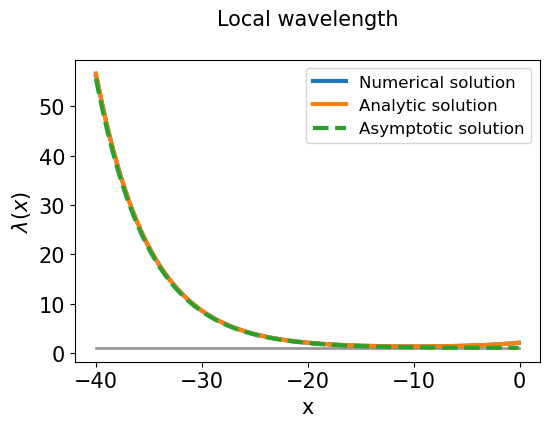

In [22]:
dx = 0.1
sigma = 10.
x1 = np.arange(-60, 60, dx)
t1 = np.array((0., 10., 20., 30., 100.))

for time in t1:
    theta1 = analytic_solution(x1, time, sigma)
    plt.plot(x1, theta1, lw = 3, label='t = '+str(int(time)))
plt.title(r'Phase profile')
plt.xlabel('x')
plt.ylabel(r'$\theta(x)$')
plt.legend()
plt.show()
t1 = np.array((10., 20., 30.))
for time in t1:
    theta1 = analytic_solution(x1, time, sigma)
    plt.plot(x1, 0.5*np.abs(np.tanh((x1 + time)/sigma) - np.tanh(x1/sigma)), label='t = '+str(int(time)), zorder=2)
    plt.plot(x1, 1./dx*np.abs(np.gradient(theta1)), zorder=1)
for time in t1:
    plt.plot(x1, 0.5*np.abs(np.tanh((x1 + time)/sigma) + 1.), ':', c='grey')
plt.title('Phase gradient')
plt.legend()
plt.xlabel('x')
plt.ylabel(r'$\frac{d \theta(x)}{d x}$')
plt.show()

for time in t1:
    theta1 = analytic_solution(x1, time, sigma)
    plt.plot(x1, dx*np.cumsum(1./dx*np.abs(np.gradient(theta1))))
    plt.plot(x1, dx*np.cumsum(0.5*np.abs(np.tanh((x1 + time)/sigma) - np.tanh(x1/sigma))), '--')
    plt.plot(x1, dx*np.cumsum(0.5*np.abs(np.tanh((x1 + time)/sigma) + 1.)), ':')
plt.title('Phase difference with posterior')
plt.show()


x1 = np.arange(-40, -0, dx)
time = 20
theta1 = analytic_solution(x1, time, sigma)
plt.plot(x1, dx/np.abs(np.gradient(theta1)), lw = 3, label='Numerical solution')
plt.plot(x1, 2./np.abs(np.tanh((x1 + time)/sigma) - np.tanh(x1/sigma)), '-', label='Analytic solution')
plt.plot(x1, 2./np.abs(np.tanh((x1 + time)/sigma) + 1.), '--', label='Asymptotic solution')
plt.plot(x1, np.ones(len(x1)), '-', c='k', alpha=.4, lw=2, zorder=1)
plt.title('Local wavelength')
plt.xlabel('x')
plt.ylabel(r'$\lambda(x)$')
plt.legend()
plt.show()

## Delayed models

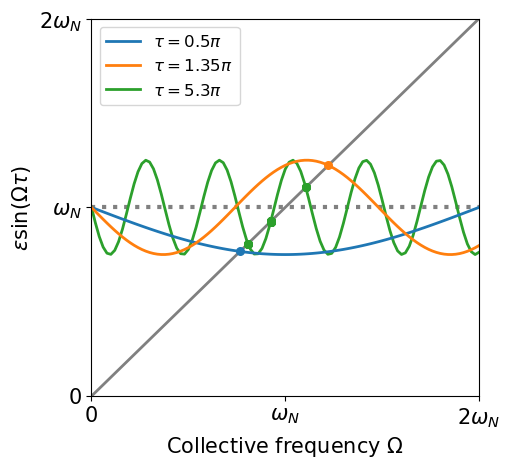

In [23]:
def iterative_root(f, x0, *pars):
    x = x0
    tol = 1e-4
    while np.abs(x - f(x, *pars)) > tol:
        x = f(x, *pars)
    return x

def transc_rhs(omega, omegaN, epsilon, tau):
    return omegaN - epsilon*np.sin(omega*tau)


omega = np.linspace(0, 2, 101)
omegaN = 1.
epsilon = 0.25
tau_values = np.array((0.5, 1.35))*np.pi/omegaN


plt.figure(figsize=(5,5))
plt.plot(omega, np.ones(len(omega)), ':', c='grey', zorder=0)
plt.plot(omega, omega, c='grey', alpha=1, lw=2, zorder=0)
for tau in tau_values:
    plt.plot(omega, omegaN - epsilon*np.sin(omega*tau), lw=2, label = r'$\tau = $'+str(tau/np.pi)+r'$\pi$')
    root = iterative_root(transc_rhs, 0., omegaN, epsilon, tau)
    plt.scatter(root, transc_rhs(root, omegaN, epsilon, tau), s=30, marker='o', zorder=5)
plt.yticks((np.arange(0., 2.01, 0.5)))
plt.xlim((0., 2.))
plt.ylim((0., 2.))
plt.legend()
# plt.show()


tau_values = np.array((5.3,))*np.pi/omegaN
init_conds = np.linspace(0., 2., 20)
# plt.figure(figsize=(5,5))
# plt.plot(omega, np.ones(len(omega)), ':', c='k', alpha=0.5)
# plt.plot(omega, omega, c='k', alpha=0.5)
for tau in tau_values:
    plt.plot(omega, omegaN - epsilon*np.sin(omega*tau), label = r'$\tau = $'+str(tau/np.pi)+r'$\pi$', lw=2, zorder=1)
    roots = np.zeros(len(init_conds))
    for i in range(len(init_conds)):
        roots[i] = iterative_root(transc_rhs, init_conds[i], omegaN, epsilon, tau)
    plt.scatter(roots, transc_rhs(roots, omegaN, epsilon, tau), s=30, marker='o', zorder=3)
plt.yticks((np.arange(0., 2.01, 0.5)))
plt.legend()
plt.xlim((0., 2.))
plt.ylim((0., 2.))
plt.xticks((0., 1., 2.), ('0', r'$\omega_N$', r'2$\omega_N$'))
plt.yticks((0., 1., 2.), ('0', r'$\omega_N$', r'2$\omega_N$'))
plt.xlabel(r'Collective frequency $\Omega$')
plt.ylabel(r'$\epsilon \sin(\Omega \tau)$')
plt.show()


## Murray model

In [24]:
L = 120
dx = 1.
x = np.arange(-3*L/4., L/4., dx)
t = np.arange(0., 120., 1.)

In [25]:
def theta_dot(t, theta, omega, A, B, dx):
    bc = (0., np.sqrt(omega/B))
    return omega + A*diffusion(theta, dx, -np.array(bc)) - B*(np.gradient(theta, dx)**2)

(120, 120)


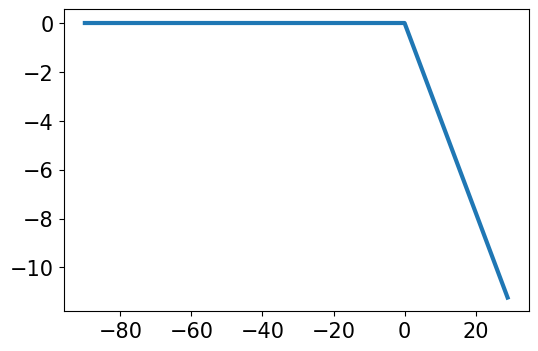

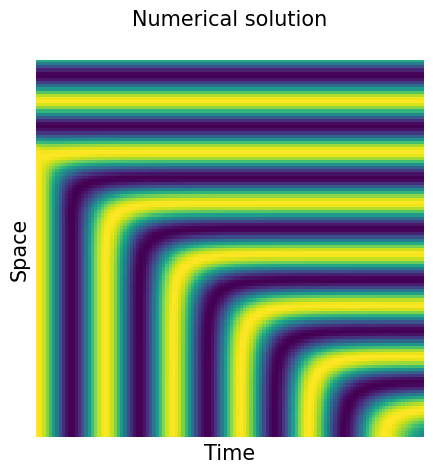

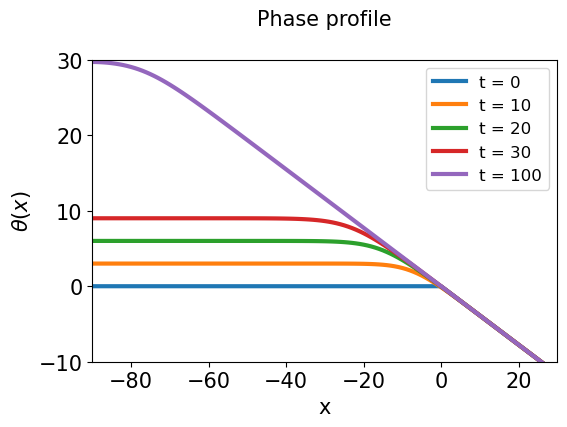

In [26]:
omega = .3
A = 4.
B = 2.


# theta0 = dx*np.cumsum(np.sqrt(omega/B)/(1+np.exp(np.sqrt(omega*B)*-x/A)))
theta0 = -x*np.sqrt(omega/B)
theta0[x<0] = theta0[x==0]

plt.plot(x, theta0)

theta = integrate(theta_dot, (np.min(t), np.max(t)), theta0, method='LSODA', t_eval=t, args=(omega, A, B, dx), rtol=1e-5).y
print(theta.shape)
plot_kymo(np.cos(theta), 'Numerical solution')


for time in (0, 10, 20, 30, 100):
    plt.plot(x, theta[:, time], label = 't = '+str(time))
plt.title(r'Phase profile')
plt.xlabel('x')
plt.ylabel(r'$\theta(x)$')
plt.xlim((-90., 30.))
plt.ylim((-10, 30.))
plt.legend()
plt.show()

## Keener reduced model

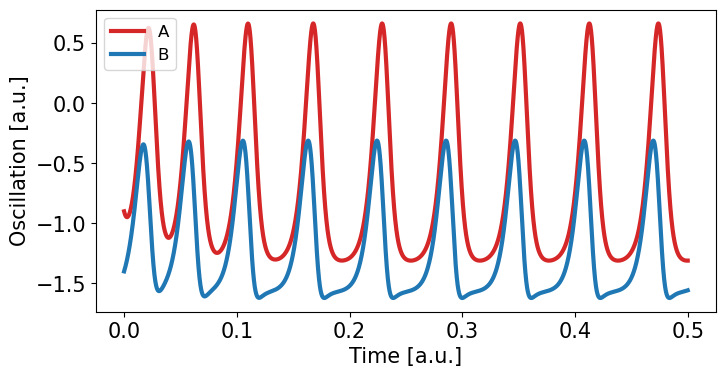

In [27]:
def keener_derivs(vec):
    a = vec[0, :]
    b = vec[1, :]
    mu=1.0
    l=-2
    c=-1
    d=1
    
    #homoclinic at 1.55, Hopf at 0 
    #da=-mu*a+b+epsilon*(0.5-a)*(0.5-a)
    # Hopf around epsilon=0.3, homoclinic aroung epsilon=0.01125
    #da=-mu*a+b+epsilon*(2*a*a+10+8*b)
    epsilon=0.1
    #epsilon=0
    #mu=0
    mu=1
    #Hopf around epsilon=0.5
    epsilon=0.26
    da=-mu*a+b+epsilon*(2*a*a+10+8*b)
    db=a*(l+c*a)+1.2*mu*b+d
    return np.array([da,db]) #.T

def keener_derivs_1d(t, y):
    vec = np.reshape(y, (2, -1))   
    derivs = keener_derivs(vec)
    return derivs.flatten()   



t = np.linspace(0.,50., 5000)
n_cells = 1
init_vec = -1.2*np.ones(n_cells*2)
#init_vec[0]=-1.0*0
init_vec[0]=-0.9
init_vec[1]=-1.4
names_plot = ['A', 'B']
colors_plot = ['tab:red', 'tab:blue']

results_osc = integrate(keener_derivs_1d, (np.min(t), np.max(t)), init_vec, method='RK45', t_eval=t, rtol=1e-6).y
plt.figure(figsize = (8,4))
for i in range(2):
    plt.plot(t/100, results_osc[i], c = colors_plot[i], label = names_plot[i])
plt.legend()
#plt.ylim([-4, 4])
plt.xlabel('Time [a.u.]')
plt.ylabel('Oscillation [a.u.]')
#plt.show()

plt.savefig('Oscillation.png')

array([-0.82617721, -0.97776727])

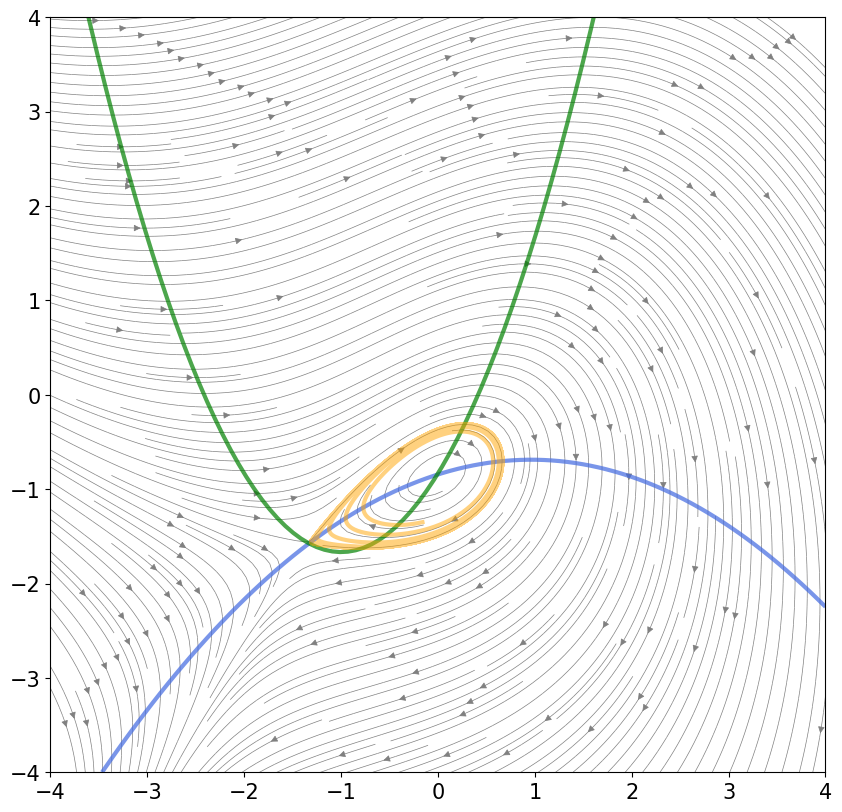

In [31]:
npoints=100
L=4

fig,ax=phase_plot(-L,L,npoints,keener_derivs_1d,)


init_vec = -np.ones(n_cells*2)
init_vec[0]=-0.16
init_vec[1]=-1.35
results_osc = integrate(keener_derivs_1d, (np.min(t), np.max(t)), init_vec, method='RK45', t_eval=t, rtol=1e-6).y

ax.plot(results_osc[0,:],results_osc[1,:],  color='orange', alpha=0.5)
results_osc[:,-1]

In [648]:
fig.savefig('keener.png')

## Phase Amplitude Model


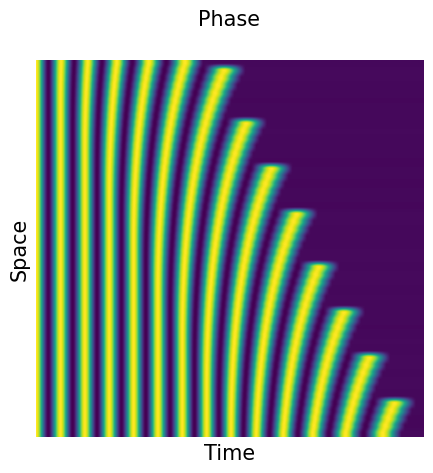

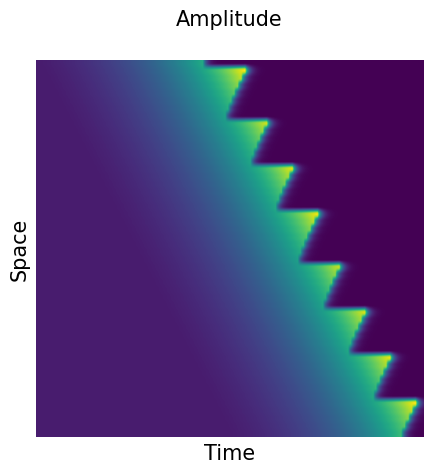

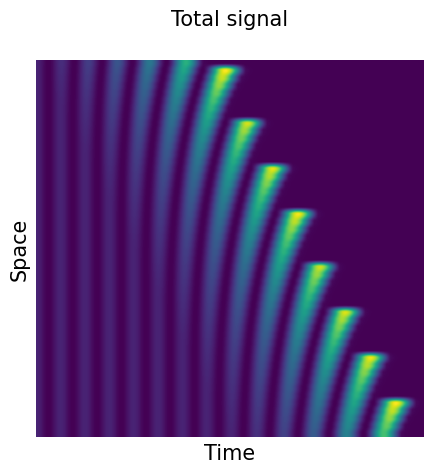

Text(0, 0.5, 'Concentration')

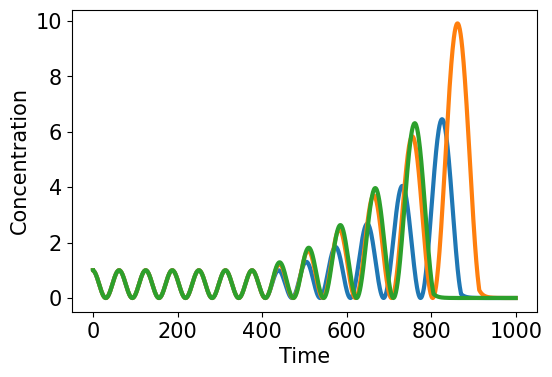

In [32]:
n_cells=50

def omega(x,t):
    #defines a moving frequency gradient from 1 to 0.5
    dom=1+0.01*((n_cells-x)-0.1*t)
    if (dom>1):
        dom=1
    if (dom<0.5):
        dom=0.5
    return dom

def dphase(ph,z,t):
    #d\phi/dt = omega, then if the  switch is 0 and the oscillation is in the through, phase stops
    dx = np.ones((n_cells,1))
    for i in range(n_cells):
        dx[i]=omega(i,t)
        if (z[i]==0) and (np.cos(ph[i])<-0.95):
            dx[i]=0
    return dx


def damp(ph,amp,z,t):
    # variation of amplitude : grows exponentially, then amplitude dies as soon as the last oscillation is performed
    dy = 0.0*amp
    for i in range(n_cells):
        if (omega(i,t)<1.0):
            dy[i]=0.05*amp[i]
        if (z[i]==0) and (np.cos(ph[i])<-0.95):
            # this triggers amplitude collapse once the last cycle is done
            dy[i]=-amp[i]
        if (z[i]==0) and (amp[i]<0.1):
            # this maintains low amplitude once amplitude has collapsed
            dy[i]=-amp[i]
    return dy

def new_z(ph,amp,z):
    # defines the switch : signals that it is the last cycle
    new_z= z
    for i in range(n_cells):
        if (amp[i]*np.cos(ph[i])>3):
            new_z[i]=0
    return new_z



def integrate_phase_amplitude():
    n_skr=1
    init_phase = np.zeros((n_cells, 1))
    init_amplitude =  0.5*np.ones((n_cells, 1))
    init_switch =  np.ones((n_cells, 1))
    results_amplitude = [init_amplitude]
    results_phase = [init_phase]
    times_plot = [0]
    phase=init_phase
    amplitude=init_amplitude
    switch=init_switch
    dt=0.1
    counter=0
    for t in range(1000):
        phase=phase+dt*dphase(phase,switch,t)
        amplitude=amplitude+dt*damp(phase,amplitude,switch,t)
        switch=new_z(phase,amplitude,switch)
        conc=amplitude
        counter += 1
        if (counter %n_skr == 0):
            results_phase.append(phase)
            results_amplitude.append(amplitude)
            times_plot.append(t)
        

    results_phase = np.array(results_phase)
    results_amplitude = np.array(results_amplitude)
    times_plot = np.array(times_plot)
    
    return results_phase[:,:,0].transpose(),results_amplitude[:,:,0].transpose(), times_plot
    
results_phase,results_amplitude,times_plot=integrate_phase_amplitude() 

fluorescence=results_amplitude*(1+np.cos(results_phase))


plot_kymo(np.cos(results_phase), 'Phase')

plot_kymo(results_amplitude, 'Amplitude')

plot_kymo(fluorescence, 'Total signal')
fig, ax = plt.subplots()  
ax.plot(times_plot,fluorescence[5,:]) 
ax.plot(times_plot,fluorescence[10,:])
ax.plot(times_plot,fluorescence[11,:])
ax.set_xlabel('Time')
ax.set_ylabel('Concentration')

## Phase SNIC model

In [33]:
def phase_change(x,alpha):
    #function to linearly change the phase as a function of parameter alpha
    # 0<alpha<2, in units of pi
    y=x % (2*np.pi)
    z=alpha*np.pi+(2-alpha)*(y-np.pi)
    z[y<np.pi]=alpha*y[y<np.pi]
    return z

def dconc_asym(g, conc,alpha,epsilon):
    g = np.array([g]).transpose()
    x = np.array([conc[:,0]]).transpose()
    dconc=1-((1.-g)+epsilon*np.sin(x)*np.sin(x))*np.cos(2*phase_change(x,alpha))
    return dconc


def compute_g(t, param):
    n_cells= param["n_cells"]
    ap_positions = np.linspace(0.0, 1.0, n_cells)
    steepness = param["steepness"]
    elongation_speed = param["elongation_speed"]
    g = 1+steepness*((1.0-ap_positions)*n_cells -elongation_speed*t)
    g[g > 1.] = 1.
    g[g < 0.] = 0.
    return g


def integrate_phase_snic(init_conc, time_param, ode_param):

    init_t = time_param["init_t"]
    total_t = time_param["total_t"]
    dt = time_param["dt"]
    times = np.arange(init_t, init_t+total_t, dt)
   
    counter = 0
    n_skr = time_param["n_skr"]  # number of Steps modulo which you want to Keep the Results
    alpha = ode_param["alpha"]
    epsilon = ode_param["epsilon"]


    conc = init_conc
    results = [conc]
    g_gradient = [compute_g(init_t, ode_param)]
    times_plot = [init_t]
    
    
    for t in times[1:]:
    
        g = compute_g(t, ode_param)
        conc = conc + dconc_asym(g, conc,alpha, epsilon)*dt     
        counter += 1
        if (counter %n_skr == 0):
            results.append(conc)
            g_gradient.append(g)
            times_plot.append(t)
        

    results = np.array(results)
    g_gradient = np.array(g_gradient)
    times_plot = np.array(times_plot)
    
    return results, g_gradient, times_plot

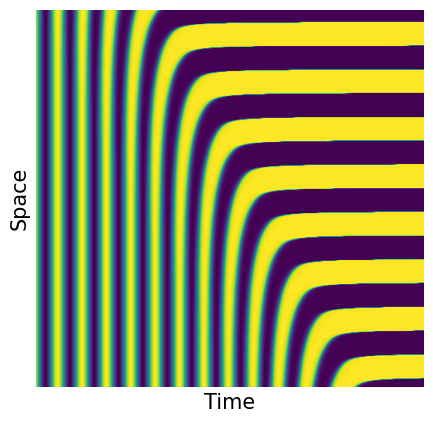

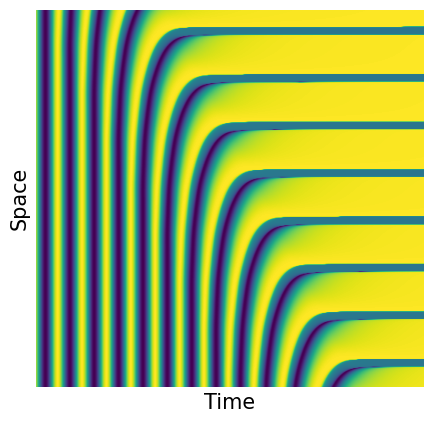

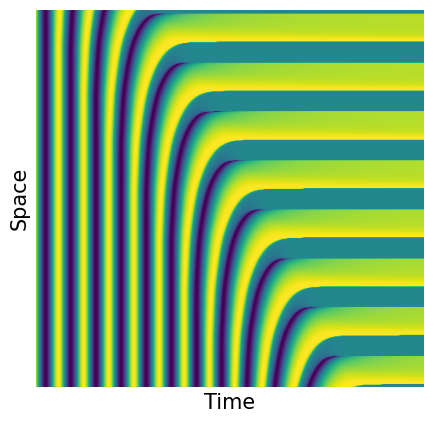

In [51]:
time_param = {
    "init_t" : 0.,
    "total_t" : 100.,
    "dt" : 0.01,
    "n_skr" : 10  # number of Steps modulo which you want to Keep the Results
}

ode_param = {
    "alpha" : 1.0,
    "epsilon" : 0.0,
    "steepness" : 0.003,
    "elongation_speed" : 10.,
    "n_cells" : 500,
  
}


n_cells= ode_param["n_cells"]

genes_names = ['A', 'B', 'C']
genes_colors = ['tab:red', 'tab:blue', 'tab:green']

init_conc = np.zeros((n_cells, 1))
init_conc[:,0] = 0.75    # Initial conditions



results, g_gradient, times_plot = integrate_phase_snic(init_conc, time_param, ode_param)
plot_kymo(1+np.cos(results[:,:,0]).transpose())


ode_param = {
    "alpha" : 1.75,
    "epsilon" : 0.0,
    "steepness" : 0.003,
    "elongation_speed" : 10.,
    "n_cells" : 500,
  
}



results, g_gradient, times_plot = integrate_phase_snic(init_conc, time_param, ode_param)
plot_kymo(1+np.cos(results[:,:,0]).transpose())



ode_param = {
    "alpha" : 1.75,
    "epsilon" : 0.15,
    "steepness" : 0.003,
    "elongation_speed" : 10.,
    "n_cells" : 500,
  
}





results, g_gradient, times_plot = integrate_phase_snic(init_conc, time_param, ode_param)
plot_kymo(1+np.cos(results[:,:,0]).transpose())


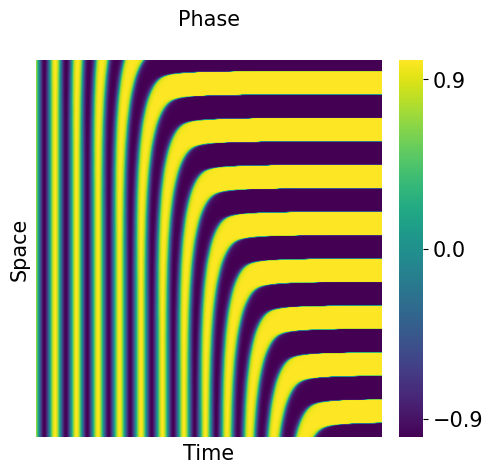

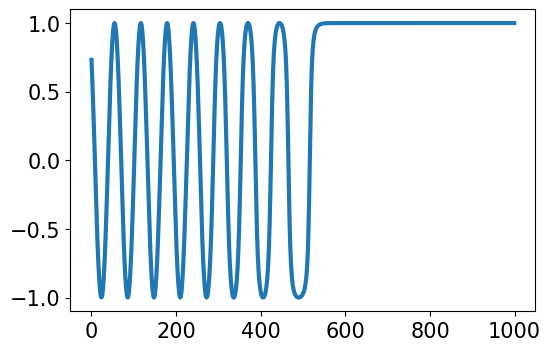

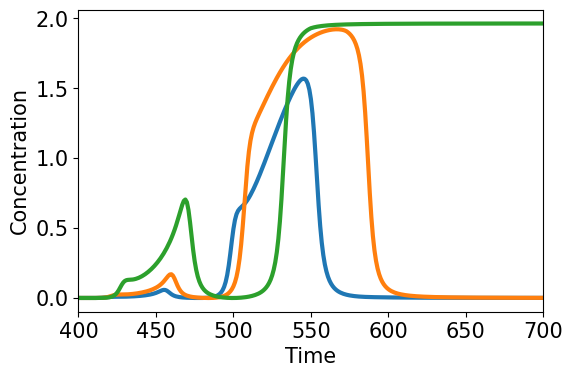

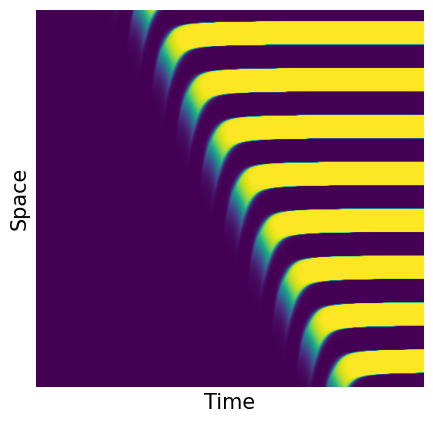

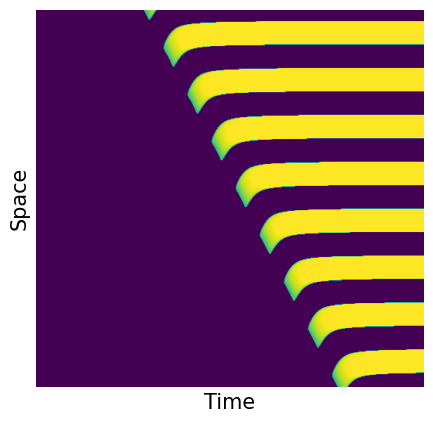

In [61]:


ode_param = {
    "alpha" : 1.0,
    "epsilon" : 0.05,
    "steepness" : 0.003,
    "elongation_speed" : 10.,
    "n_cells" : 500,
  
}


results, g_gradient, times_plot = integrate_phase_snic(init_conc, time_param, ode_param)

oscillations=np.cos(results[:,:,0].transpose())
plot_kymo(oscillations, 'Phase',colorbar=True, cb_ticks=[-0.9, 0., 0.9])
plt.plot(np.cos(results[:,270,0]))
epsilon=ode_param["epsilon"]
window=(1.-g_gradient[:,:].transpose())+epsilon*np.sin(results[:,:,0].transpose())*np.sin(results[:,:,0].transpose())

def hill(x):
    threshold=0.8
    return np.exp(20*(x-threshold))/(np.exp(20*(x-threshold))+1)


Pseudo_Mesp=hill(window)*(oscillations+1)



fig, ax = plt.subplots() 
caud=245
mid=260
ant=283
ax.plot(Pseudo_Mesp[caud,:])
ax.plot(Pseudo_Mesp[mid,:])
ax.plot(Pseudo_Mesp[ant,:])
#ax.plot(Pseudo_Mesp[295,:])
ax.set_xlim([400,700])
ax.set_xlabel('Time')
ax.set_ylabel('Concentration')

#Pseudo_Mesp[caud,:]=0
#Pseudo_Mesp[mid,:]=0
#Pseudo_Mesp[ant,:]=0
plot_kymo(Pseudo_Mesp)

Blocks=Pseudo_Mesp
Blocks[Pseudo_Mesp<1.3]=0.0

plot_kymo(Blocks)


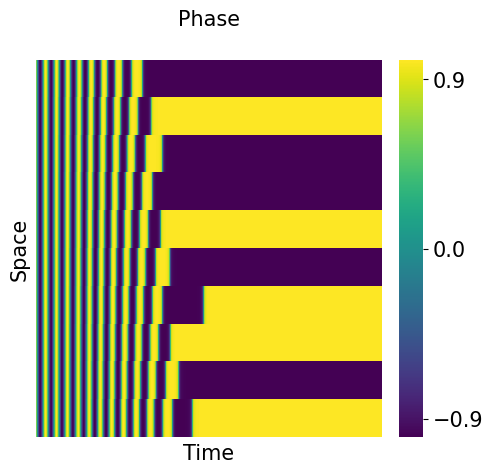

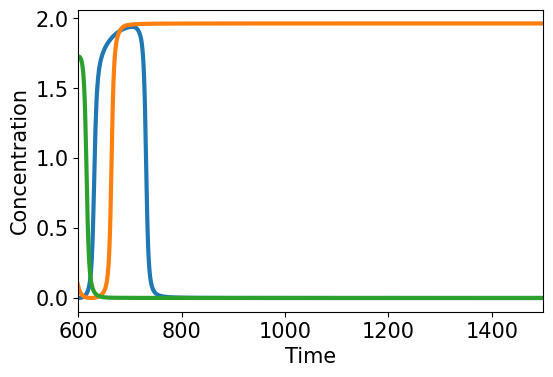

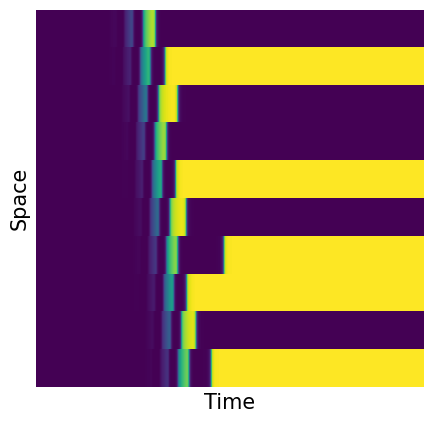

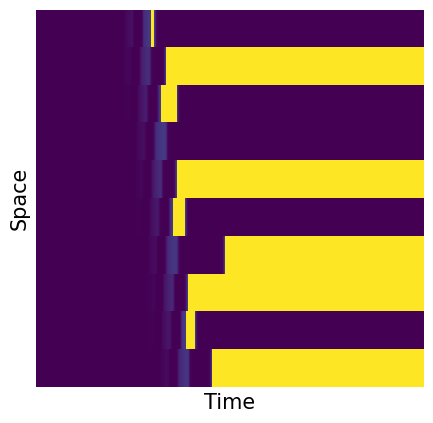

In [414]:
time_param = {
    "init_t" : 0.,
    "total_t" : 200.,
    "dt" : 0.01,
    "n_skr" : 10  # number of Steps modulo which you want to Keep the Results
}

ode_param = {
    "alpha" : 1.0,
    "epsilon" : 0.0,
    "steepness" : 0.03,
    "elongation_speed" : 0.5,
    "n_cells" : 10,
  
}


n_cells= ode_param["n_cells"]

genes_names = ['A', 'B', 'C']
genes_colors = ['tab:red', 'tab:blue', 'tab:green']

init_conc = np.zeros((n_cells, 1))
init_conc[:,0] = 0.75    # Initial conditions


results, g_gradient, times_plot = integrate_phase_snic(init_conc, time_param, ode_param)
oscillations=np.cos(results[:,:,0].transpose())
plot_kymo(oscillations, 'Phase',colorbar=True, cb_ticks=[-0.9, 0., 0.9],interpolation="nearest")
#plt.plot(np.cos(results[:,270,0]))
epsilon=ode_param["epsilon"]
window=(1.-g_gradient[:,:].transpose())+epsilon*np.sin(results[:,:,0].transpose())*np.sin(results[:,:,0].transpose())

def hill(x):
    threshold=0.8
    return np.exp(20*(x-threshold))/(np.exp(20*(x-threshold))+1)


Pseudo_Mesp=hill(window)*(oscillations+1)



fig, ax = plt.subplots() 
caud=7
mid=8
ant=9
ax.plot(Pseudo_Mesp[caud,:])
ax.plot(Pseudo_Mesp[mid,:])
ax.plot(Pseudo_Mesp[ant,:])
#ax.plot(Pseudo_Mesp[295,:])
ax.set_xlim([600,1500])
ax.set_xlabel('Time')
ax.set_ylabel('Concentration')

#Pseudo_Mesp[caud,:]=0
#Pseudo_Mesp[mid,:]=0
#Pseudo_Mesp[ant,:]=0
plot_kymo(Pseudo_Mesp,interpolation="nearest")

Blocks=Pseudo_Mesp
Blocks[Pseudo_Mesp>1.7]=10.0

plot_kymo(Blocks, interpolation="nearest")


### Evolved clock and switch


In [62]:
def HillA(x,t,n):
    return x**n/(x**n+t**n)


def HillR(x,t,n):
    return 1/(1+(x/t)**n)

def deriv(vec,history,t):
    e = vec[:,0]
    r = vec[:,1]

    de=-0.853818252561968*e;
    dr=-0.9758821074508301*r
    
    d_e=48
    delayed=np.zeros((n_cells,3))
    #print(t,history.shape)
    if (t>d_e):
        delayed=history[t-48]

    delayed_e=delayed[:,0]
    delayed_r=delayed[:,1]
    delayed_g=delayed[:,2]
    rate=0.717566*np.maximum(HillA(delayed_e,0.321251,3),HillA(delayed_g,0.067799,4.354903))*HillR(delayed_r,0.494191,4.532086)
    de=de+rate
            
            
    d_r=392
    delayed=np.zeros((n_cells,3))
    if (t>d_r):
        delayed=history[t-392]

    delayed_e=delayed[:,0]
    delayed_r=delayed[:,1]
    delayed_g=delayed[:,2]
    rate=0.942165*HillA(delayed_g,0.504665,3.213598)*HillR(delayed_r,0.115629,4.522007);
    dr=dr+rate;

    

    dg=0*e
    return np.array([de, dr, dg]).transpose()


def compute_g(t,param):
    n_cells= param["n_cells"]
    elongation_speed = param["elongation_speed"]
    ap_positions = np.linspace(0.0, 1.0, n_cells)
    
    g = (1.0-ap_positions)*n_cells -elongation_speed*t
    g[g > 1.] = 1.
    g[g < 0.] = 0.
    
    return g


In [63]:
def integrate_evolved(init_vec, time_param, ode_param):

    init_t = time_param["init_t"]
    total_t = time_param["total_t"]
    dt = time_param["dt"]
    times = np.arange(init_t, init_t+total_t, dt)
    
    counter = 0
    n_skr = time_param["n_skr"]  # number of Steps modulo which you want to Keep the Results


    
    vec = init_vec
    g = compute_g(0,ode_param)
    vec[:,2]=g
    results = [vec]
    history=[vec]
    times_plot = [init_t]



    for t in range(len(times[1:])):
        

        vec = vec +deriv(vec,history,t)*dt
        g = compute_g(t*dt,ode_param)
        vec[:,2]=g
        #print(vec)
        history.append(vec)
        counter += 1
        if (counter %n_skr == 0):
            results.append(vec)
            times_plot.append(t*dt)
        

    results = np.array(results)
    times_plot = np.array(times_plot)
    
    return results, times_plot

In [64]:
time_param = {
    "init_t" : 0.,
    "total_t" : 200.,
    "dt" : 0.01,
    "n_skr" : 10  # number of Steps modulo which you want to Keep the Results
}

ode_param = {
    
    "dif_coef" : 0.01,
    "n_cells" : 50,
    "elongation_speed" : 0.6,
}

n_cells= ode_param["n_cells"]
init_vec = 0.1*np.ones((n_cells, 3))

names_plot = ['E', 'R', 'G']
colors_plot = ['tab:red', 'tab:blue', 'tag:green']
results,times_plot = integrate_evolved(init_vec, time_param, ode_param)

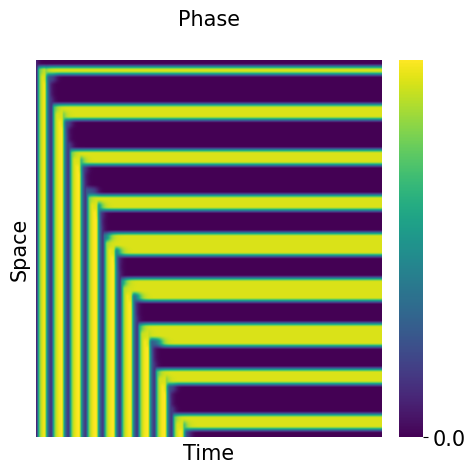

In [65]:
plot_kymo(results[:,:,0].transpose(), 'Phase',colorbar=True, cb_ticks=[-0.9, 0., 0.9])

## Jutras Dube et al Model

In [66]:
def dynamic(vec):
    
    y = vec[:,0]
    z = vec[:,1]
    r = np.sqrt(y*y+z*z)
    
    dy = y*(1.-r) -z
    dz = z*(1.-r) +y
    
    return np.array([dy, dz]).transpose()



def static(vec):
    
    y = vec[:,0]
    z = vec[:,1]
    
    dy = y*(1.-y*y)
    dz = -z
    
    return np.array([dy, dz]).transpose()



def intermediate(vec):
    
    y = vec[:,0]
    z = vec[:,1]
    
    dy = -y
    dz = -z
    
    return np.array([dy, dz]).transpose()



def dvec(vec, g, param):
    
    g = np.array([g, g]).transpose()
    ng = param["ng"]
    if_interm = param["if_interm"]
    
    return g**ng*dynamic(vec) +(1.-g)**ng*static(vec) +if_interm*g*(1.-g)*intermediate(vec)

In [67]:
def compute_g_geom(t, param):
    
    x_osc = param["x_osc"]
    s = param["s"]
    v = param["v"]
    positions = np.linspace(0.0, 1.0, param["n_cells"])
    
    g = np.exp(s*(1.0-positions +x_osc -v*t))
    g[g > 1.] = 1.
    
    return g

In [68]:
def integrate_geom(init_conc, param):

    # Set the integration parameters
    total_t = param["total_t"]
    dt = param["dt"]
    times = np.arange(0., total_t, dt)
    times_plot = [0.]

    vec = init_vec
    results = [vec]
    g = compute_g_geom(0., param)
    g_gradient = [g]
    omega = param["omega"]
    noise_level = param["noise"]
    counter = 0
    n_steps_keep_results = param["n_steps_keep_results"]

    
    # Perform the integration
    for t in times[1:]:
        
        # Compute noise
        noise = noise_level*np.random.normal(loc=0., scale=1., size=vec.shape)
        
        # Introduce noise in the cells at a fixed rate
        x_posterior_psm = int(t*param["v"]*param["n_cells"])
        if (x_posterior_psm < param["n_cells"]):    
            noise[x_posterior_psm:] = noise[x_posterior_psm]
            
        # Update the state vector
        vec = vec +dvec(vec, g, param)*dt +noise*np.sqrt(dt/omega)
        g = compute_g_geom(t, param)
           
        counter += 1
        if (counter %n_steps_keep_results == 0):
            results.append(vec)
            g_gradient.append(g)
            times_plot.append(t)
        

    # Output the results
    results = np.array(results)
    g_gradient = np.array(g_gradient)
    times_plot = np.array(times_plot)
    
    return results, g_gradient, times_plot

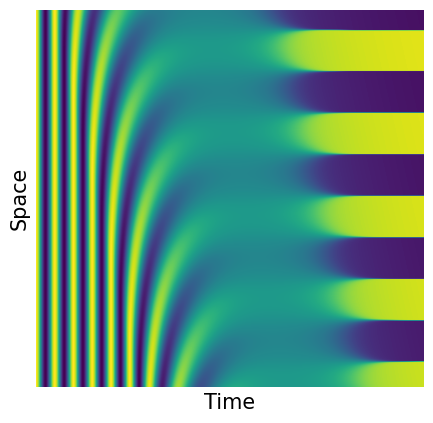

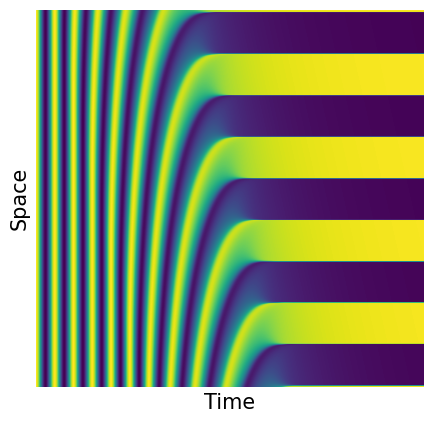

In [69]:
param ={
    
    # ODE parameters
    "ng"        : 3,
    "if_interm" : 1.,
    
    # Morphogen gradient parameters
    "x_osc"   : 0.2,
    "s"       : 0.5,
    "v"       : 0.035,
    "n_cells" : 500,
    
    # Integration parameters
    "total_t"              : 130.,
    "dt"                   : 0.01,
    "n_steps_keep_results" : 1,
    "omega"                : 1000.,
    "noise"                : 0.                
}


init_vec = np.zeros((param["n_cells"], 2))
init_vec[:,0] = 1.


# Gene-free model with a Hopf bifurcation (Model 1)
param["ng"] = 3
param["if_interm"] = 1.
results_noise_Hopf, g_gradient_noise_Hopf, times_plot_noise_Hopf = integrate_geom(init_vec, param)
plot_kymo(results_noise_Hopf[:,:,0].transpose())


# Gene-free model with a SNIC bifurcation (Model 2)
param["ng"] = 1
param["if_interm"] = 0.
results_noise_SNIC, g_gradient_noise_SNIC, times_plot_noise_SNIC = integrate_geom(init_vec, param)
plot_kymo(results_noise_SNIC[:,:,0].transpose())

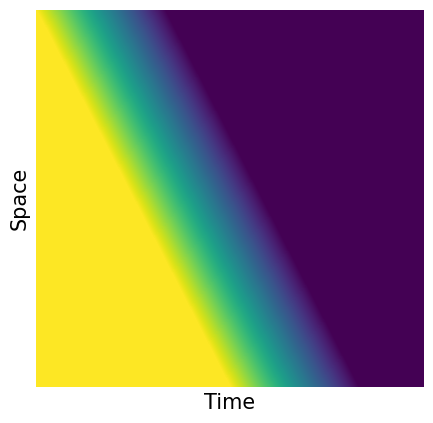

In [70]:
plot_kymo(g_gradient.transpose())

In [71]:
# Import necessary modules
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint

# Define the system of equations
def system(state, t):
    x, y = state
    dx = 1-x*x
    dy = -y
    return [dx, dy]

# Set the range of x and y values to plot
x = np.linspace(-3, 3, 10)
y = np.linspace(-3, 3, 10)

# Create a grid of initial states
xx, yy = np.meshgrid(x, y)
initial_states = np.array([xx, yy]).T

# Loop over the initial states and solve the equations for each one
states = []
for initial_state in initial_states:
    for true_init in initial_state:
        #print(true_init)
        state = odeint(system, true_init, np.arange(0, 10, 0.01))
        states.append(state[-1])
#states = np.array(states)

print(states)
# Check which points end up in the two fixed points
basin1 = np.logical_and(np.abs(states[:,0] + 1) < 1e-2, np.abs(states[:,0] + 0) < 1e-2)
basin2 = np.logical_and(np.abs(states[:,1] - 1) < 1e-2, np.abs(states[:,1] + 0) < 1e-2)

print(basin1)
print(basin2)
# Plot the basins of attraction
plt.imshow(np.flipud(basin1.reshape((10, 10))), extent=[-3, 3, -3, 3], cmap='Reds')
plt.imshow(np.flipud(basin2.reshape((10, 10))), extent=[-3, 3, -3, 3], cmap='Blues')

# Show the plot
plt.show()


[array([1.  , 0.01]), array([0.99086661, 0.13963053]), array([1., 1.]), array([0.12056987, 0.12044912]), array([0.93301641, 0.33824055]), array([0.29332734, 0.29303357]), array([0.98285911, 0.18901767]), array([0.98465898, 0.17917257]), array([9.74, 9.75]), array([-0.99067077, -0.1350335 ]), array([0.1204855 , 0.12036484]), array([-0.99068941, -0.13490159]), array([-0.99068568, -0.13492796]), array([0.12040119, 0.12028061]), array([-0.99070429, -0.13479616]), array([-0.99070057, -0.13482251]), array([0.12031694, 0.12019644]), array([-0.99071914, -0.13469082]), array([-0.99071543, -0.13471715]), array([0.12023275, 0.12011233]), array([-0.99073398, -0.13458557]), array([-0.99073027, -0.13461187]), array([0.12014861, 0.12002828]), array([-0.99074878, -0.13448041]), array([-0.99074508, -0.13450669]), array([0.12006454, 0.11994429]), array([-0.99076356, -0.13437533]), array([-0.99075987, -0.13440159]), array([0.11998052, 0.11986036]), array([-0.99077832, -0.13427035]), array([-1.0000000e+00

TypeError: list indices must be integers or slices, not tuple